# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
from os import makedirs
from os.path import isfile, isdir, join, exists

data_dir   = './data'
prefix     = '.'
pkl_folder = 'pkl-files'
pkl_prefix = join(prefix, pkl_folder)

pkl_sub    = 'saved_var_checkpoint'                  #sub-folder
pkl_subpth = join(pkl_prefix, pkl_sub)       #filename will be added at runtime 

chk_folder = 'checkpoints'
chk_prefix = join(prefix, chk_folder)

chk_sub    = 'historic_losses'                       #sub-folder
chk_subpth  = join(chk_prefix, chk_sub)       #filename will be added at runtime

f_names = [chk_subpth, pkl_subpth, data_dir]

for foldername in f_names:
    if not exists(foldername):
        makedirs(foldername)

if not isdir(pkl_subpth):
    raise Exception("pkl directory doesn't exist!")
if not isdir(chk_subpth):
    raise Exception("Checkpoints directory doesn't exist!")


    
        
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
# pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
# pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), \
'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    
    real_dim      = (image_width, image_height, image_channels)
    inputs_real   = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z      = tf.placeholder(tf.float32, (None, z_dim),     name='input_z')
    learning_rate = tf.placeholder(tf.float32, None,              name='learning_rate')
    
    return inputs_real, inputs_z, learning_rate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def leaky_relu(r, alpha=0.2):
    return tf.maximum(alpha * r, r)

def array_product(array):
    result = 1
    for n in array:
        result *= int(n)
    return result

In [7]:
Dkeep_prob      = 0.6            # initialize

def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    global Dkeep_prob            
    
    kernel_init = tf.contrib.layers.xavier_initializer()
    
    # no batch norm on the 1st layer
    with tf.variable_scope('discriminator', reuse=reuse):
        kernel_size = 4
        conv1 = tf.layers.conv2d(images, 128, kernel_size, strides=2, padding='same', kernel_initializer=kernel_init)
        drop1 = tf.layers.dropout(conv1, Dkeep_prob)
        leak1 = leaky_relu(drop1, alpha=alpha)
        #print("leak1.sh",leak1.shape) #leak1.sh (?, 14, 14, 128)
        
        conv2 = tf.layers.conv2d(leak1, 256, kernel_size, strides=2, padding='same', kernel_initializer=kernel_init)
        drop2 = tf.layers.dropout(conv2, Dkeep_prob)
        bnor2 = tf.layers.batch_normalization(drop2, training=True)
        leak2 = leaky_relu(bnor2, alpha=alpha)
        #print("leak2.sh",leak2.shape) # leak2.sh (?, 7, 7, 256)
        
        conv3 = tf.layers.conv2d(leak2, 512, kernel_size, strides=2, padding='same', kernel_initializer=kernel_init)
        drop3 = tf.layers.dropout(conv3, Dkeep_prob)
        bnor3 = tf.layers.batch_normalization(drop3, training=True)
        leak3 = leaky_relu(bnor3, alpha=alpha)
        #print("leak3.sh",leak3.shape) # leak3.sh (?, 4, 4, 512)
    
        shape4 = tf.reshape(leak3, [-1, array_product(leak3.get_shape()[1:])])
        #print("shape4.sh",shape4.shape) # shape4.sh (?, 8192)
        
        logits = tf.layers.dense(shape4, 1)
        output = tf.sigmoid(logits)
    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
Gkeep_prob      = 0.6            # initialize

def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # print("z", z.shape) # z (?, 100)
    # target (28,28, out_channel_dim)
    # inspired by http://distill.pub/2016/deconv-checkerboard/
    
    global Gkeep_prob           # another tool we can use to make the G more steady, less irratic
    kernel_init = tf.contrib.layers.xavier_initializer()
    
    with tf.variable_scope('generator', reuse=not is_train): 
        kernel_size = 2
        dense = tf.layers.dense(z, 3*3*512)
        # print("dense", dense.shape)       # dense (?, 4608)
        
        shape1 = tf.reshape(dense, [-1, 3, 3, 512])
        drop1  = tf.layers.dropout(shape1, Gkeep_prob)
        bnor1  = tf.layers.batch_normalization(drop1, training=is_train)
        leak1  = leaky_relu(bnor1)
        # print("leak1", leak1.shape)       # leak1 (?,  3, 3, 512)
        
        bili2  = tf.image.resize_images(leak1, [7, 7])    # default method=ResizeMethod.BILINEAR
        # print("bili2", bili2.shape)       # bili2 (?, 7, 7, 512)
        
        tran2  = tf.layers.conv2d_transpose(bili2, 256, kernel_size, strides=2, padding='same', \
                                            kernel_initializer=kernel_init)
        # print("tran2",tran2.shape)        # tran2 (?, 7, 7, 256)
        
        # while still trying to stabilize G - I try less Drops in the lower G: inspired by: 
        # https://medium.com/towards-data-science/gan-by-example-using-keras-on-tensorflow-backend-1a6d515a60d0
        bnor2  = tf.layers.batch_normalization(tran2, training=is_train)
        leak2  = leaky_relu(bnor2)
        
        bili3  = tf.image.resize_images(leak2, [14, 14])    # default method=ResizeMethod.BILINEAR
        # print("bili3", bili3.shape)       # bili3 (?, 14, 14, 256)
                
        tran3  = tf.layers.conv2d_transpose(bili3, 128, kernel_size, strides=2, padding='same', \
                                            kernel_initializer=kernel_init)
        # print("tran3",tran3.shape)        # tran3 (?, 14, 14, 128)
        
        bnor3  = tf.layers.batch_normalization(tran3, training=is_train)
        leak3  = leaky_relu(bnor3)
        
        bili4  = tf.image.resize_images(leak3, [28, 28])    # default method=ResizeMethod.BILINEAR
        # print("bili4", bili4.shape)     # bili4 (?, 28, 28, 128)
                        
        logits = tf.layers.conv2d_transpose(bili4, out_channel_dim, 5, strides=1, padding='same')
        # print("logits",logits.shape)    # logits (?, 28, 28, 5)
        
        # print("chan",out_channel_dim)   # chan 5
        output = tf.tanh(logits)
        
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # no longer two GPU's 
    # with tf.device(gpu1):
    g_model = generator(input_z, out_channel_dim)
    
    # with tf.device(gpu0):
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    d_loss_real = tf.reduce_mean(
                tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                            labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
                tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                            labels=tf.zeros_like(d_model_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(
                tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                            labels=tf.ones_like(d_model_fake)))
    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        # with tf.device(gpu0):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        # with tf.device(gpu1):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        
    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()


### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
import pickle as pkl

import time
import datetime
from datetime import timedelta 

def timestmp():
    print ("tmstmp")
    print (datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
    
def split(start_time):
    split_time = time.time()
    time_dif   = split_time - start_time
    time_str = str(timedelta(seconds = int(time_dif)))
    return time_dif, time_str
    

In [13]:
import pylab 
import numpy as np

def plot_loss(losses, steps_graph):
    fig, ax = pyplot.subplots()
    step_list = [x* steps_graph for x in range(len(losses))]
    losses = np.array(losses)
    pyplot.plot(losses.T[0], label='Discriminator', alpha=0.5)
    pyplot.plot(losses.T[1], label='Generator', alpha=0.5)
    pyplot.title("Training Losses")
    pyplot.legend()
    pyplot.show()
    

In [14]:
#from laplotter import LossAccPlotter
from collections import deque
import numpy as np

def train(epochs, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epochs: Number of epochs pr. run
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # global
    global filename
    global Load_chk
    global steps_printline
    global steps_images
    global chkfilepth
    global pckfilepth
    global num_mv_avg    
    
    # var
    steps           = 0
    laststeps       = 0
    last_elapsed    = 0
    samples, losses = [], []
    start_time      = time.time()
    mov_av_list     = deque()
    #plotter         = LossAccPlotter()
    
    image_dim = data_shape[1:]
    channels  = image_dim[-1]
    
    image_mode = "L" if channels == 1 else "RGB"
    
    input_real, input_z, lr = model_inputs(*image_dim, z_dim)
    d_loss, g_loss                     = model_loss(input_real, input_z, channels)
    d_opt, g_opt                       = model_opt(d_loss, g_loss, learning_rate, beta1)
        
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        saver           = tf.train.Saver()
        
        # implemented in train() so I can separate data from the two runs at runtime
        # so we can separate MNIST files from CELEBA-files
        chk_suffix = '.chk'
        chkfilepth = os.path.join(chk_subpth, filename+chk_suffix)
        pkl_suffix = '.pkl'
        pklfilepth = os.path.join(pkl_subpth, filename+pkl_suffix)

        # we need to add .meta - to see that the 3 chkpoint files are present
        metapklfilepth = pklfilepth+'.meta'
        
        if (Load_chk==True):
            # don't know why [isfile] wouldn't work ATM - will have to look into that..
            # ...anyway the model- & losses- restore works even if the isfile doesn't
            saver.restore(sess, chkfilepth)
            print('Model restored.')
            with open(pklfilepth, 'rb') as rl:
                losses = pkl.load(rl)
            print ('historic losses loaded')    
            
            # if isfile(metachkfilepth):
            # else:
                #raise Exception("Cannot find Checkpoint-data file [",metapklfilepth,"] doesn't exist!")
            
            # if isfile(pklfilepth):
            # else:
                # raise Exception("Losses-data file [",pklfilepth,"]doesn't exist!")
                
        timestmp    
        for epoch_i in range(epochs):
            for batch_images in get_batches(batch_size):
                steps += 1
                
                # Sample noise
                batch_z = np.random.uniform(-1, 1, size=[batch_size, z_dim])
                
                # Optimize
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, 
                                               input_z: batch_z, 
                                               lr: learning_rate})
 
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, 
                                               input_z: batch_z, 
                                               lr: learning_rate})
                
                # two xtra optimizations inspired by the chats on SLACK and the orig. GAN paper
                # this is an attempt at stabilizing the Generator and countering the Discriminator overpowering
                # the Generator 
                # so the G takes 3 little steps towards optimum - recalc - and 1 step towards opt
                # -- while D take one on the same batch
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, 
                                               input_z: batch_z, 
                                               lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, 
                                               input_z: batch_z, 
                                               lr: learning_rate})
                
                if steps % steps_printline == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                    elapsed_time, time_str = split(start_time)
                    elapsed_steps  = steps-laststeps
                    step_time      = elapsed_time-last_elapsed
                    st_time_str = str(timedelta(seconds = int(step_time)))
                    time_rest      = (elapsed_time/(epoch_i+1))*(epochs-epoch_i)/60
                    
                    if (len(mov_av_list)>num_mv_avg):
                        mov_av_list.popleft()
                        mov_av_list.append(time_rest)
                    else:
                        mov_av_list.append(time_rest)
                    mov_av = np.mean(mov_av_list)
                    
                    print("Epoch:{:2}/{:2}".format(epoch_i+1, epochs),
                          "Time: {:8}s.".format(time_str),
                          "st_Tm: {:8}s.".format(st_time_str),
                          "#Steps:{:4},".format(steps),
                          "DLoss:{:7.4f}".format(train_loss_d),
                          "GLoss:{:7.4f}".format(train_loss_g),
                          "guess:{:4.0f}m.".format(time_rest),
                          "average:{:4.0f}m.".format(mov_av))
                    laststeps = steps
                    last_elapsed = elapsed_time 
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))
                
                if (steps == 1) or (steps % steps_images == 0): 
                    show_generator_output(sess, 81, input_z, channels, image_mode)
                    print()
                    if (Load_chk==True):
                        plot_loss(losses, steps_graph)
                if (steps % steps_graph == 0):
                    print()
                    plot_loss(losses, steps_graph)
                    print("losses saved to: ",pklfilepth)    
                    with open(pklfilepth, 'wb') as wl:
                        pkl.dump(losses, wl)
                    
        saver.save(sess, chkfilepth)
        timestmp
        print("checkpoint saved")
        
        #does not work need to implement LossAccPlotter 
        plot_loss(losses, steps_graph)
        # trying to separate the 3 plots
        for d in range(5, 0, -1):
            print(d)
        show_generator_output(sess, 81, input_z, channels, image_mode)
        for d in range(5, 0, -1):
            print(d)
        show_generator_output(sess, 4, input_z, channels, image_mode)
        for d in range(5, 0, -1):
            print(d)
        show_generator_output(sess, 4, input_z, channels, image_mode)

    print("pickle should open: ",pklfilepth)    
    with open(pklfilepth, 'wb') as wl:
        pkl.dump(losses, wl)
    print ("finished training {} epochs".format(epochs))
    

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

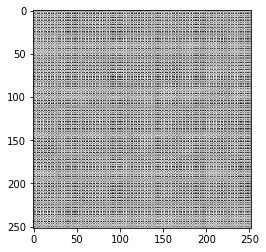


Epoch: 1/10 Time: 0:00:50 s. st_Tm: 0:00:50 s. #Steps:  32, DLoss: 2.9938 GLoss: 0.1315 guess:   8m. average:   8m.
Epoch: 1/10 Time: 0:01:38 s. st_Tm: 0:00:47 s. #Steps:  64, DLoss: 4.4664 GLoss: 0.0208 guess:  16m. average:  12m.
Epoch: 1/10 Time: 0:02:25 s. st_Tm: 0:00:47 s. #Steps:  96, DLoss: 4.9919 GLoss: 5.1630 guess:  24m. average:  16m.
Epoch: 1/10 Time: 0:03:13 s. st_Tm: 0:00:47 s. #Steps: 128, DLoss: 0.1556 GLoss: 2.7093 guess:  32m. average:  20m.


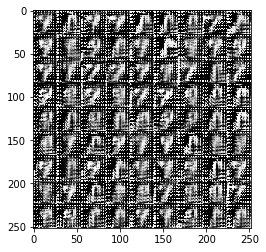


Epoch: 1/10 Time: 0:04:00 s. st_Tm: 0:00:47 s. #Steps: 160, DLoss: 0.0865 GLoss: 4.2958 guess:  40m. average:  24m.
Epoch: 1/10 Time: 0:04:47 s. st_Tm: 0:00:46 s. #Steps: 192, DLoss: 1.1721 GLoss: 2.4465 guess:  48m. average:  28m.
Epoch: 1/10 Time: 0:05:34 s. st_Tm: 0:00:46 s. #Steps: 224, DLoss: 3.8126 GLoss: 8.4857 guess:  56m. average:  32m.
Epoch: 1/10 Time: 0:06:21 s. st_Tm: 0:00:47 s. #Steps: 256, DLoss: 1.3563 GLoss: 5.5713 guess:  64m. average:  36m.


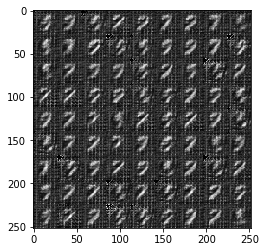

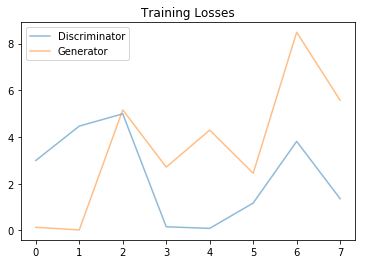

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 1/10 Time: 0:07:09 s. st_Tm: 0:00:47 s. #Steps: 288, DLoss: 0.0175 GLoss:12.2069 guess:  72m. average:  40m.
Epoch: 1/10 Time: 0:07:56 s. st_Tm: 0:00:47 s. #Steps: 320, DLoss: 1.4898 GLoss: 0.3941 guess:  79m. average:  44m.
Epoch: 1/10 Time: 0:08:43 s. st_Tm: 0:00:47 s. #Steps: 352, DLoss: 0.3016 GLoss: 4.0281 guess:  87m. average:  48m.
Epoch: 1/10 Time: 0:09:30 s. st_Tm: 0:00:47 s. #Steps: 384, DLoss: 0.6928 GLoss: 0.9751 guess:  95m. average:  52m.


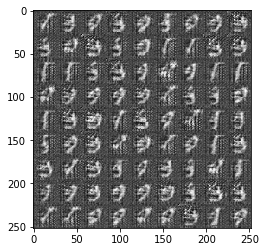


Epoch: 1/10 Time: 0:10:18 s. st_Tm: 0:00:47 s. #Steps: 416, DLoss: 0.1954 GLoss: 2.1237 guess: 103m. average:  56m.
Epoch: 1/10 Time: 0:11:05 s. st_Tm: 0:00:47 s. #Steps: 448, DLoss: 1.7534 GLoss: 0.3550 guess: 111m. average:  64m.
Epoch: 2/10 Time: 0:11:52 s. st_Tm: 0:00:46 s. #Steps: 480, DLoss: 0.3525 GLoss: 1.5036 guess:  53m. average:  67m.
Epoch: 2/10 Time: 0:12:39 s. st_Tm: 0:00:47 s. #Steps: 512, DLoss: 0.6210 GLoss: 0.8954 guess:  57m. average:  69m.


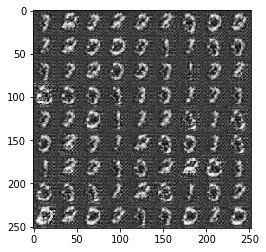

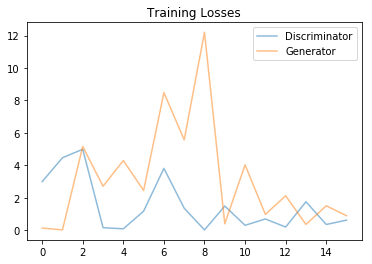

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 2/10 Time: 0:13:27 s. st_Tm: 0:00:47 s. #Steps: 544, DLoss: 0.5877 GLoss: 1.0595 guess:  61m. average:  71m.
Epoch: 2/10 Time: 0:14:14 s. st_Tm: 0:00:47 s. #Steps: 576, DLoss: 0.2846 GLoss: 2.2438 guess:  64m. average:  73m.
Epoch: 2/10 Time: 0:15:01 s. st_Tm: 0:00:46 s. #Steps: 608, DLoss: 0.0836 GLoss: 3.8093 guess:  68m. average:  75m.
Epoch: 2/10 Time: 0:15:48 s. st_Tm: 0:00:46 s. #Steps: 640, DLoss: 0.0193 GLoss: 5.3865 guess:  71m. average:  76m.


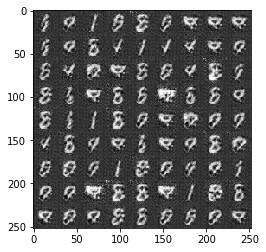


Epoch: 2/10 Time: 0:16:36 s. st_Tm: 0:00:47 s. #Steps: 672, DLoss: 1.0480 GLoss: 0.5593 guess:  75m. average:  77m.
Epoch: 2/10 Time: 0:17:23 s. st_Tm: 0:00:47 s. #Steps: 704, DLoss: 0.3894 GLoss: 1.3508 guess:  78m. average:  77m.
Epoch: 2/10 Time: 0:18:11 s. st_Tm: 0:00:47 s. #Steps: 736, DLoss: 0.3580 GLoss: 1.4996 guess:  82m. average:  77m.
Epoch: 2/10 Time: 0:18:58 s. st_Tm: 0:00:47 s. #Steps: 768, DLoss: 1.6889 GLoss: 0.3959 guess:  85m. average:  77m.


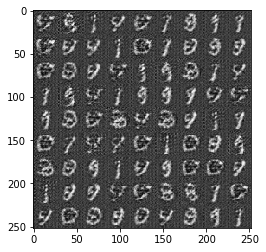

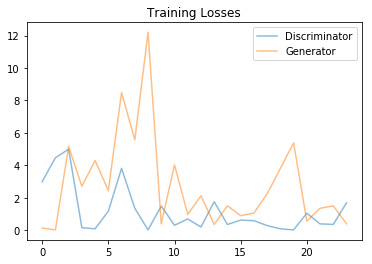

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 2/10 Time: 0:19:45 s. st_Tm: 0:00:47 s. #Steps: 800, DLoss: 0.0130 GLoss: 5.8306 guess:  89m. average:  77m.
Epoch: 2/10 Time: 0:20:32 s. st_Tm: 0:00:47 s. #Steps: 832, DLoss: 0.0218 GLoss: 5.8011 guess:  92m. average:  76m.
Epoch: 2/10 Time: 0:21:20 s. st_Tm: 0:00:47 s. #Steps: 864, DLoss: 0.0105 GLoss: 7.5264 guess:  96m. average:  75m.
Epoch: 2/10 Time: 0:22:07 s. st_Tm: 0:00:47 s. #Steps: 896, DLoss: 0.0216 GLoss: 4.2088 guess: 100m. average:  78m.


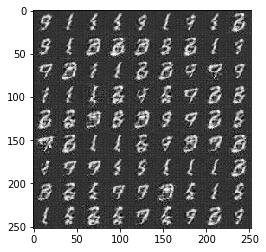


Epoch: 2/10 Time: 0:22:54 s. st_Tm: 0:00:47 s. #Steps: 928, DLoss: 1.0994 GLoss: 2.3116 guess: 103m. average:  82m.
Epoch: 3/10 Time: 0:23:41 s. st_Tm: 0:00:46 s. #Steps: 960, DLoss: 0.6840 GLoss: 0.8896 guess:  63m. average:  82m.
Epoch: 3/10 Time: 0:24:28 s. st_Tm: 0:00:47 s. #Steps: 992, DLoss: 0.2124 GLoss: 1.9814 guess:  65m. average:  82m.
Epoch: 3/10 Time: 0:25:16 s. st_Tm: 0:00:47 s. #Steps:1024, DLoss: 0.5832 GLoss: 1.0454 guess:  67m. average:  82m.


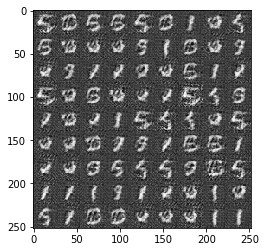

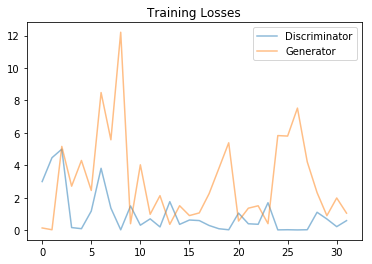

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 3/10 Time: 0:26:03 s. st_Tm: 0:00:47 s. #Steps:1056, DLoss: 0.4151 GLoss: 2.1205 guess:  69m. average:  82m.
Epoch: 3/10 Time: 0:26:50 s. st_Tm: 0:00:46 s. #Steps:1088, DLoss: 0.0565 GLoss: 3.6054 guess:  72m. average:  82m.
Epoch: 3/10 Time: 0:27:36 s. st_Tm: 0:00:46 s. #Steps:1120, DLoss: 0.0882 GLoss: 4.2423 guess:  74m. average:  81m.
Epoch: 3/10 Time: 0:28:23 s. st_Tm: 0:00:46 s. #Steps:1152, DLoss: 0.0764 GLoss: 3.0331 guess:  76m. average:  81m.


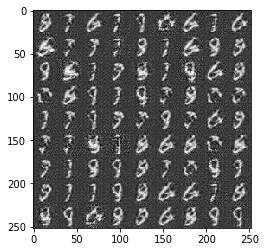


Epoch: 3/10 Time: 0:29:10 s. st_Tm: 0:00:47 s. #Steps:1184, DLoss: 0.0222 GLoss: 4.7150 guess:  78m. average:  80m.
Epoch: 3/10 Time: 0:29:57 s. st_Tm: 0:00:46 s. #Steps:1216, DLoss: 0.0328 GLoss: 5.1659 guess:  80m. average:  80m.
Epoch: 3/10 Time: 0:30:44 s. st_Tm: 0:00:46 s. #Steps:1248, DLoss: 0.1401 GLoss: 2.2768 guess:  82m. average:  79m.
Epoch: 3/10 Time: 0:31:31 s. st_Tm: 0:00:46 s. #Steps:1280, DLoss: 0.2737 GLoss: 2.4244 guess:  84m. average:  78m.


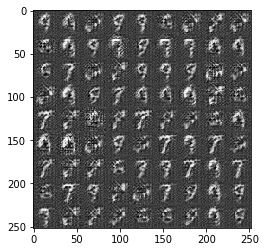

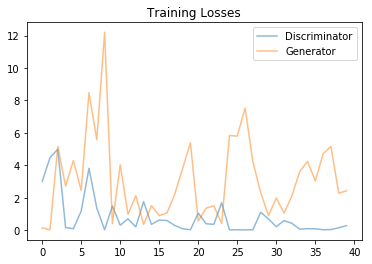

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 3/10 Time: 0:32:18 s. st_Tm: 0:00:47 s. #Steps:1312, DLoss: 0.1706 GLoss: 4.3469 guess:  86m. average:  77m.
Epoch: 3/10 Time: 0:33:05 s. st_Tm: 0:00:46 s. #Steps:1344, DLoss: 0.0488 GLoss: 5.3582 guess:  88m. average:  76m.
Epoch: 3/10 Time: 0:33:52 s. st_Tm: 0:00:47 s. #Steps:1376, DLoss: 0.0613 GLoss: 5.0884 guess:  90m. average:  78m.
Epoch: 4/10 Time: 0:34:39 s. st_Tm: 0:00:46 s. #Steps:1408, DLoss: 0.0752 GLoss: 3.1930 guess:  61m. average:  77m.


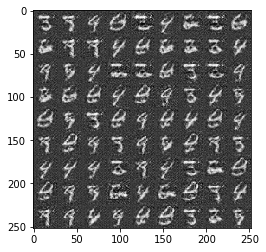


Epoch: 4/10 Time: 0:35:28 s. st_Tm: 0:00:49 s. #Steps:1440, DLoss: 0.0180 GLoss: 5.3090 guess:  62m. average:  77m.
Epoch: 4/10 Time: 0:36:16 s. st_Tm: 0:00:47 s. #Steps:1472, DLoss: 0.0687 GLoss: 3.1384 guess:  63m. average:  77m.
Epoch: 4/10 Time: 0:37:03 s. st_Tm: 0:00:46 s. #Steps:1504, DLoss: 0.0217 GLoss: 7.4985 guess:  65m. average:  76m.
Epoch: 4/10 Time: 0:37:49 s. st_Tm: 0:00:46 s. #Steps:1536, DLoss: 0.0067 GLoss: 6.1644 guess:  66m. average:  75m.


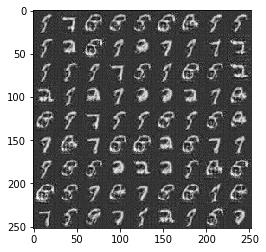

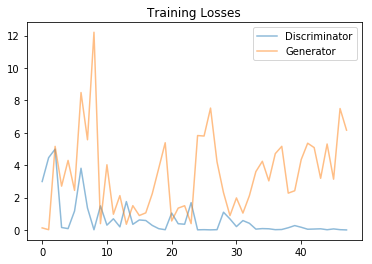

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 4/10 Time: 0:38:37 s. st_Tm: 0:00:47 s. #Steps:1568, DLoss: 1.3617 GLoss:13.1845 guess:  68m. average:  75m.
Epoch: 4/10 Time: 0:39:23 s. st_Tm: 0:00:46 s. #Steps:1600, DLoss: 0.0946 GLoss: 3.3443 guess:  69m. average:  74m.
Epoch: 4/10 Time: 0:40:10 s. st_Tm: 0:00:46 s. #Steps:1632, DLoss: 0.0823 GLoss: 2.9797 guess:  70m. average:  73m.
Epoch: 4/10 Time: 0:40:56 s. st_Tm: 0:00:46 s. #Steps:1664, DLoss: 0.0525 GLoss: 3.5312 guess:  72m. average:  73m.


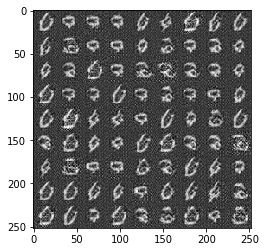


Epoch: 4/10 Time: 0:41:43 s. st_Tm: 0:00:47 s. #Steps:1696, DLoss: 0.0280 GLoss: 4.1834 guess:  73m. average:  72m.
Epoch: 4/10 Time: 0:42:31 s. st_Tm: 0:00:47 s. #Steps:1728, DLoss: 0.0182 GLoss: 8.0066 guess:  74m. average:  71m.
Epoch: 4/10 Time: 0:43:19 s. st_Tm: 0:00:48 s. #Steps:1760, DLoss: 0.0500 GLoss: 3.2860 guess:  76m. average:  70m.
Epoch: 4/10 Time: 0:44:06 s. st_Tm: 0:00:46 s. #Steps:1792, DLoss: 0.2694 GLoss: 1.8808 guess:  77m. average:  69m.


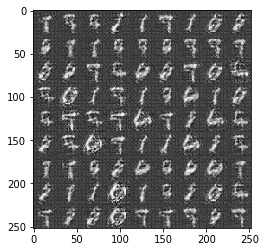

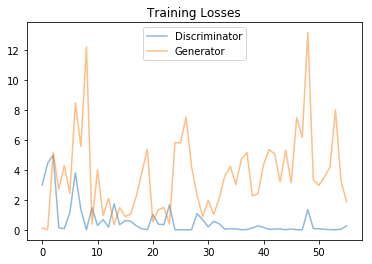

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 4/10 Time: 0:44:54 s. st_Tm: 0:00:48 s. #Steps:1824, DLoss: 0.0382 GLoss: 4.1831 guess:  79m. average:  70m.
Epoch: 4/10 Time: 0:45:40 s. st_Tm: 0:00:46 s. #Steps:1856, DLoss: 0.0344 GLoss: 4.0602 guess:  80m. average:  72m.
Epoch: 5/10 Time: 0:46:27 s. st_Tm: 0:00:46 s. #Steps:1888, DLoss: 0.0970 GLoss: 2.8509 guess:  56m. average:  71m.
Epoch: 5/10 Time: 0:47:14 s. st_Tm: 0:00:46 s. #Steps:1920, DLoss: 0.1659 GLoss: 2.4345 guess:  57m. average:  70m.


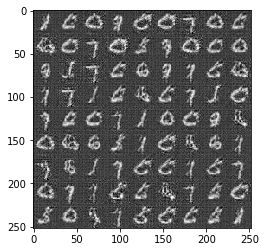


Epoch: 5/10 Time: 0:48:01 s. st_Tm: 0:00:46 s. #Steps:1952, DLoss: 0.0553 GLoss: 3.5529 guess:  58m. average:  70m.
Epoch: 5/10 Time: 0:48:48 s. st_Tm: 0:00:46 s. #Steps:1984, DLoss: 0.0494 GLoss: 4.1263 guess:  59m. average:  69m.
Epoch: 5/10 Time: 0:49:35 s. st_Tm: 0:00:46 s. #Steps:2016, DLoss: 0.0342 GLoss: 4.4858 guess:  60m. average:  68m.
Epoch: 5/10 Time: 0:50:21 s. st_Tm: 0:00:46 s. #Steps:2048, DLoss: 0.0206 GLoss: 5.1290 guess:  60m. average:  68m.


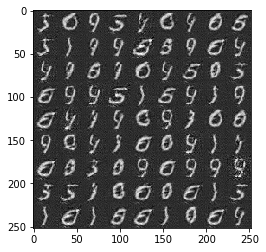

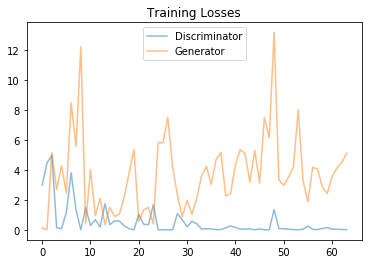

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 5/10 Time: 0:51:08 s. st_Tm: 0:00:47 s. #Steps:2080, DLoss: 0.0052 GLoss: 7.7415 guess:  61m. average:  67m.
Epoch: 5/10 Time: 0:51:55 s. st_Tm: 0:00:46 s. #Steps:2112, DLoss: 0.0042 GLoss: 7.2406 guess:  62m. average:  66m.
Epoch: 5/10 Time: 0:52:41 s. st_Tm: 0:00:46 s. #Steps:2144, DLoss: 0.0040 GLoss: 8.3299 guess:  63m. average:  65m.
Epoch: 5/10 Time: 0:53:28 s. st_Tm: 0:00:46 s. #Steps:2176, DLoss: 0.0024 GLoss: 8.0137 guess:  64m. average:  64m.


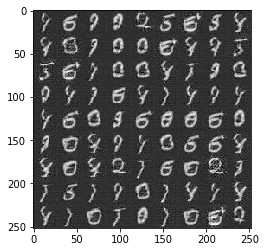


Epoch: 5/10 Time: 0:54:15 s. st_Tm: 0:00:46 s. #Steps:2208, DLoss: 0.1997 GLoss: 2.0954 guess:  65m. average:  63m.
Epoch: 5/10 Time: 0:55:01 s. st_Tm: 0:00:45 s. #Steps:2240, DLoss: 0.0289 GLoss: 4.3149 guess:  66m. average:  62m.
Epoch: 5/10 Time: 0:55:47 s. st_Tm: 0:00:46 s. #Steps:2272, DLoss: 0.0160 GLoss: 5.1864 guess:  67m. average:  61m.
Epoch: 5/10 Time: 0:56:34 s. st_Tm: 0:00:46 s. #Steps:2304, DLoss: 0.0088 GLoss: 5.4839 guess:  68m. average:  62m.


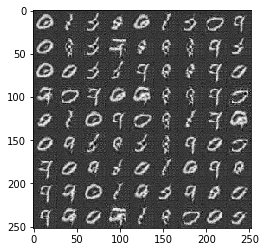

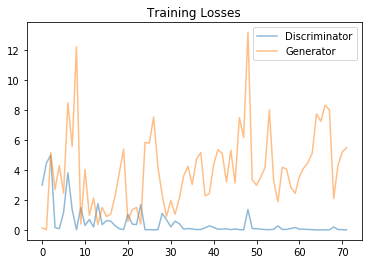

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 5/10 Time: 0:57:21 s. st_Tm: 0:00:47 s. #Steps:2336, DLoss: 0.0176 GLoss: 4.6217 guess:  69m. average:  63m.
Epoch: 6/10 Time: 0:58:09 s. st_Tm: 0:00:47 s. #Steps:2368, DLoss: 0.0267 GLoss: 4.1820 guess:  48m. average:  63m.
Epoch: 6/10 Time: 0:58:55 s. st_Tm: 0:00:46 s. #Steps:2400, DLoss: 0.0729 GLoss: 3.0386 guess:  49m. average:  62m.
Epoch: 6/10 Time: 0:59:42 s. st_Tm: 0:00:47 s. #Steps:2432, DLoss: 0.1681 GLoss: 3.1160 guess:  50m. average:  61m.


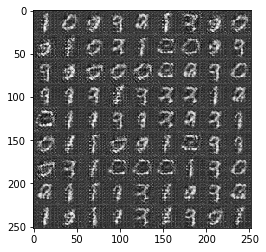


Epoch: 6/10 Time: 1:00:29 s. st_Tm: 0:00:47 s. #Steps:2464, DLoss: 0.0440 GLoss: 4.1029 guess:  50m. average:  60m.
Epoch: 6/10 Time: 1:01:16 s. st_Tm: 0:00:46 s. #Steps:2496, DLoss: 0.0744 GLoss: 3.0927 guess:  51m. average:  59m.
Epoch: 6/10 Time: 1:02:03 s. st_Tm: 0:00:46 s. #Steps:2528, DLoss: 0.1174 GLoss: 2.5483 guess:  52m. average:  59m.
Epoch: 6/10 Time: 1:02:49 s. st_Tm: 0:00:46 s. #Steps:2560, DLoss: 0.0381 GLoss: 3.6041 guess:  52m. average:  58m.


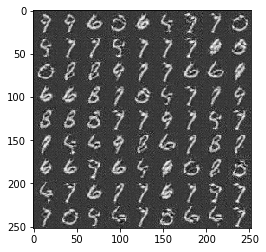

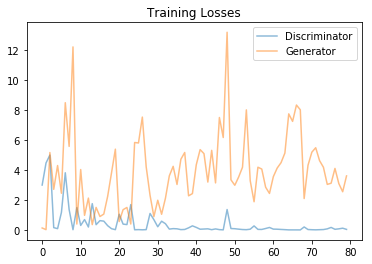

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 6/10 Time: 1:03:37 s. st_Tm: 0:00:47 s. #Steps:2592, DLoss: 0.2174 GLoss: 3.6578 guess:  53m. average:  57m.
Epoch: 6/10 Time: 1:04:24 s. st_Tm: 0:00:46 s. #Steps:2624, DLoss: 0.0478 GLoss: 3.9808 guess:  54m. average:  56m.
Epoch: 6/10 Time: 1:05:11 s. st_Tm: 0:00:46 s. #Steps:2656, DLoss: 0.0484 GLoss: 3.8174 guess:  54m. average:  55m.
Epoch: 6/10 Time: 1:05:57 s. st_Tm: 0:00:46 s. #Steps:2688, DLoss: 0.0451 GLoss: 3.5403 guess:  55m. average:  54m.


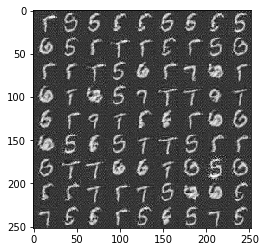


Epoch: 6/10 Time: 1:06:44 s. st_Tm: 0:00:47 s. #Steps:2720, DLoss: 0.0134 GLoss: 7.9402 guess:  56m. average:  53m.
Epoch: 6/10 Time: 1:07:30 s. st_Tm: 0:00:46 s. #Steps:2752, DLoss: 0.0124 GLoss: 4.8042 guess:  56m. average:  52m.
Epoch: 6/10 Time: 1:08:16 s. st_Tm: 0:00:45 s. #Steps:2784, DLoss: 0.0059 GLoss: 6.0148 guess:  57m. average:  53m.
Epoch: 7/10 Time: 1:09:02 s. st_Tm: 0:00:45 s. #Steps:2816, DLoss: 0.0164 GLoss: 4.4358 guess:  39m. average:  52m.


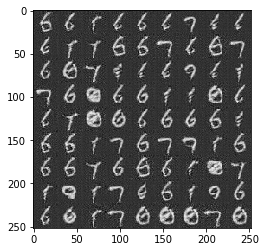

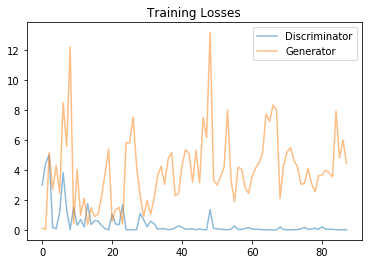

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 7/10 Time: 1:09:48 s. st_Tm: 0:00:46 s. #Steps:2848, DLoss: 0.0096 GLoss: 5.8268 guess:  40m. average:  52m.
Epoch: 7/10 Time: 1:10:34 s. st_Tm: 0:00:45 s. #Steps:2880, DLoss: 0.0085 GLoss: 5.2113 guess:  40m. average:  51m.
Epoch: 7/10 Time: 1:11:19 s. st_Tm: 0:00:45 s. #Steps:2912, DLoss: 0.0026 GLoss: 8.8208 guess:  41m. average:  50m.
Epoch: 7/10 Time: 1:12:04 s. st_Tm: 0:00:45 s. #Steps:2944, DLoss: 0.6181 GLoss: 3.8862 guess:  41m. average:  49m.


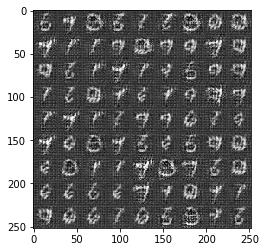


Epoch: 7/10 Time: 1:12:50 s. st_Tm: 0:00:46 s. #Steps:2976, DLoss: 0.1801 GLoss: 2.4459 guess:  42m. average:  48m.
Epoch: 7/10 Time: 1:13:35 s. st_Tm: 0:00:45 s. #Steps:3008, DLoss: 0.2300 GLoss: 5.7084 guess:  42m. average:  47m.
Epoch: 7/10 Time: 1:14:20 s. st_Tm: 0:00:45 s. #Steps:3040, DLoss: 0.4130 GLoss: 1.3761 guess:  42m. average:  47m.
Epoch: 7/10 Time: 1:15:06 s. st_Tm: 0:00:45 s. #Steps:3072, DLoss: 0.1673 GLoss: 2.4600 guess:  43m. average:  46m.


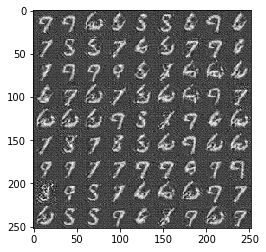

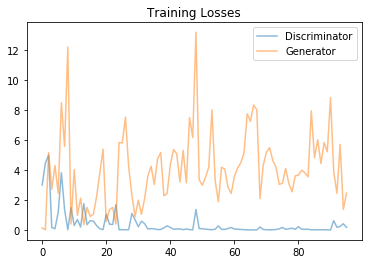

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 7/10 Time: 1:15:52 s. st_Tm: 0:00:46 s. #Steps:3104, DLoss: 0.0409 GLoss: 3.9036 guess:  43m. average:  45m.
Epoch: 7/10 Time: 1:16:38 s. st_Tm: 0:00:45 s. #Steps:3136, DLoss: 0.0373 GLoss: 4.1780 guess:  44m. average:  44m.
Epoch: 7/10 Time: 1:17:24 s. st_Tm: 0:00:46 s. #Steps:3168, DLoss: 1.9042 GLoss: 4.9582 guess:  44m. average:  43m.
Epoch: 7/10 Time: 1:18:10 s. st_Tm: 0:00:46 s. #Steps:3200, DLoss: 0.1921 GLoss: 2.2736 guess:  45m. average:  42m.


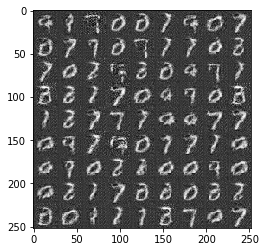


Epoch: 7/10 Time: 1:18:57 s. st_Tm: 0:00:46 s. #Steps:3232, DLoss: 0.0824 GLoss: 2.9410 guess:  45m. average:  42m.
Epoch: 7/10 Time: 1:19:44 s. st_Tm: 0:00:46 s. #Steps:3264, DLoss: 0.0240 GLoss: 5.2867 guess:  46m. average:  43m.
Epoch: 8/10 Time: 1:20:29 s. st_Tm: 0:00:45 s. #Steps:3296, DLoss:12.1834 GLoss:15.4227 guess:  30m. average:  42m.
Epoch: 8/10 Time: 1:21:16 s. st_Tm: 0:00:46 s. #Steps:3328, DLoss: 0.0964 GLoss: 2.9892 guess:  30m. average:  41m.


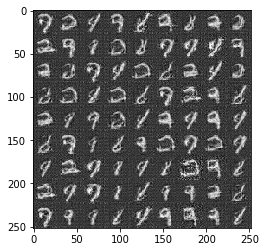

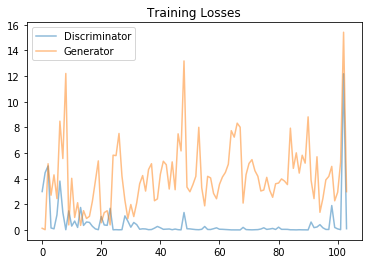

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 8/10 Time: 1:22:03 s. st_Tm: 0:00:47 s. #Steps:3360, DLoss: 0.0322 GLoss: 3.9948 guess:  31m. average:  41m.
Epoch: 8/10 Time: 1:22:49 s. st_Tm: 0:00:46 s. #Steps:3392, DLoss: 0.0201 GLoss: 4.6892 guess:  31m. average:  40m.
Epoch: 8/10 Time: 1:23:36 s. st_Tm: 0:00:46 s. #Steps:3424, DLoss: 0.0686 GLoss: 4.1634 guess:  31m. average:  39m.
Epoch: 8/10 Time: 1:24:22 s. st_Tm: 0:00:46 s. #Steps:3456, DLoss: 0.2312 GLoss: 1.8599 guess:  32m. average:  38m.


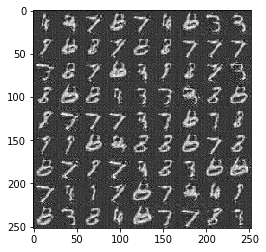


Epoch: 8/10 Time: 1:25:09 s. st_Tm: 0:00:46 s. #Steps:3488, DLoss: 0.0399 GLoss: 7.0247 guess:  32m. average:  37m.
Epoch: 8/10 Time: 1:25:56 s. st_Tm: 0:00:46 s. #Steps:3520, DLoss: 0.0452 GLoss: 3.5336 guess:  32m. average:  36m.
Epoch: 8/10 Time: 1:26:42 s. st_Tm: 0:00:46 s. #Steps:3552, DLoss: 0.1979 GLoss: 3.9094 guess:  33m. average:  36m.
Epoch: 8/10 Time: 1:27:29 s. st_Tm: 0:00:46 s. #Steps:3584, DLoss: 0.0778 GLoss: 3.2940 guess:  33m. average:  35m.


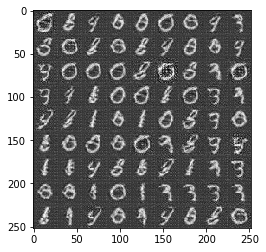

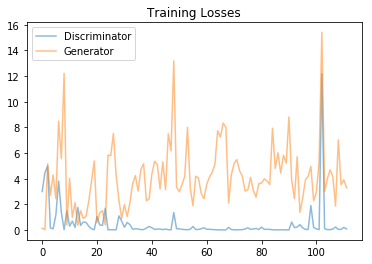

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 8/10 Time: 1:28:17 s. st_Tm: 0:00:48 s. #Steps:3616, DLoss: 0.1653 GLoss: 2.1360 guess:  33m. average:  34m.
Epoch: 8/10 Time: 1:29:03 s. st_Tm: 0:00:45 s. #Steps:3648, DLoss: 0.0984 GLoss: 2.6740 guess:  33m. average:  33m.
Epoch: 8/10 Time: 1:29:48 s. st_Tm: 0:00:45 s. #Steps:3680, DLoss: 0.0192 GLoss: 4.9460 guess:  34m. average:  32m.
Epoch: 8/10 Time: 1:30:34 s. st_Tm: 0:00:45 s. #Steps:3712, DLoss: 0.0102 GLoss: 7.6114 guess:  34m. average:  32m.


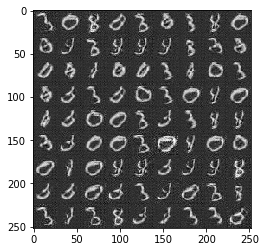


Epoch: 8/10 Time: 1:31:21 s. st_Tm: 0:00:46 s. #Steps:3744, DLoss: 0.0115 GLoss: 7.2041 guess:  34m. average:  33m.
Epoch: 9/10 Time: 1:32:07 s. st_Tm: 0:00:46 s. #Steps:3776, DLoss: 0.0090 GLoss: 6.5944 guess:  20m. average:  32m.
Epoch: 9/10 Time: 1:32:53 s. st_Tm: 0:00:45 s. #Steps:3808, DLoss: 0.0193 GLoss: 5.1147 guess:  21m. average:  31m.
Epoch: 9/10 Time: 1:33:39 s. st_Tm: 0:00:45 s. #Steps:3840, DLoss: 0.0040 GLoss: 8.8825 guess:  21m. average:  30m.


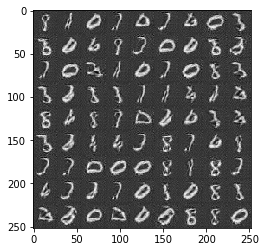

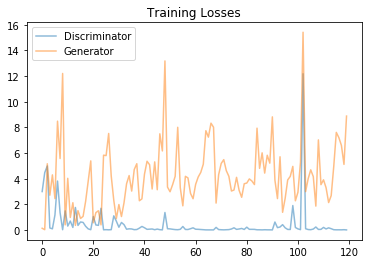

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 9/10 Time: 1:34:26 s. st_Tm: 0:00:47 s. #Steps:3872, DLoss: 0.0062 GLoss: 7.0219 guess:  21m. average:  29m.
Epoch: 9/10 Time: 1:35:12 s. st_Tm: 0:00:46 s. #Steps:3904, DLoss: 1.6340 GLoss: 2.0701 guess:  21m. average:  28m.
Epoch: 9/10 Time: 1:35:58 s. st_Tm: 0:00:46 s. #Steps:3936, DLoss: 0.0984 GLoss: 3.1433 guess:  21m. average:  28m.
Epoch: 9/10 Time: 1:36:45 s. st_Tm: 0:00:46 s. #Steps:3968, DLoss: 0.0553 GLoss: 3.6622 guess:  22m. average:  27m.


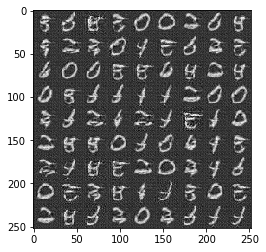


Epoch: 9/10 Time: 1:37:32 s. st_Tm: 0:00:47 s. #Steps:4000, DLoss: 0.1123 GLoss: 2.8856 guess:  22m. average:  26m.
Epoch: 9/10 Time: 1:38:22 s. st_Tm: 0:00:49 s. #Steps:4032, DLoss: 0.0308 GLoss: 4.7778 guess:  22m. average:  25m.
Epoch: 9/10 Time: 1:39:13 s. st_Tm: 0:00:50 s. #Steps:4064, DLoss: 0.0086 GLoss: 6.1072 guess:  22m. average:  24m.
Epoch: 9/10 Time: 1:40:02 s. st_Tm: 0:00:49 s. #Steps:4096, DLoss: 0.1172 GLoss: 2.7018 guess:  22m. average:  23m.


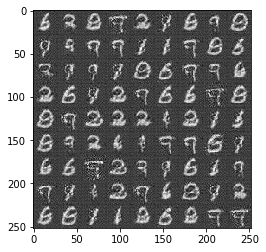

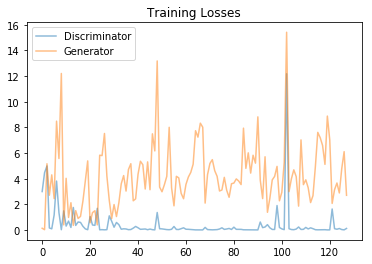

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch: 9/10 Time: 1:40:51 s. st_Tm: 0:00:49 s. #Steps:4128, DLoss: 0.0352 GLoss: 4.5332 guess:  22m. average:  22m.
Epoch: 9/10 Time: 1:41:41 s. st_Tm: 0:00:50 s. #Steps:4160, DLoss: 0.0202 GLoss: 5.2530 guess:  23m. average:  22m.
Epoch: 9/10 Time: 1:42:30 s. st_Tm: 0:00:49 s. #Steps:4192, DLoss: 0.0098 GLoss: 6.2994 guess:  23m. average:  22m.
Epoch:10/10 Time: 1:43:20 s. st_Tm: 0:00:49 s. #Steps:4224, DLoss: 0.0064 GLoss: 8.5857 guess:  10m. average:  21m.


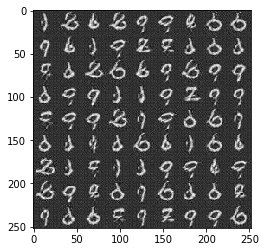


Epoch:10/10 Time: 1:44:10 s. st_Tm: 0:00:50 s. #Steps:4256, DLoss: 0.0021 GLoss: 7.6284 guess:  10m. average:  20m.
Epoch:10/10 Time: 1:45:01 s. st_Tm: 0:00:51 s. #Steps:4288, DLoss: 0.0037 GLoss: 6.6630 guess:  11m. average:  19m.
Epoch:10/10 Time: 1:45:50 s. st_Tm: 0:00:49 s. #Steps:4320, DLoss: 0.0077 GLoss: 6.0239 guess:  11m. average:  18m.
Epoch:10/10 Time: 1:46:39 s. st_Tm: 0:00:48 s. #Steps:4352, DLoss: 0.0208 GLoss: 4.4627 guess:  11m. average:  18m.


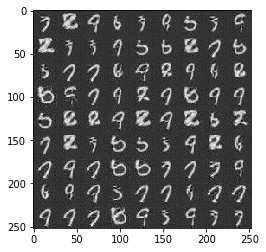

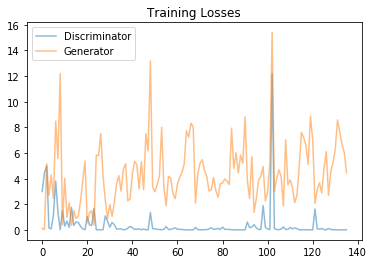

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch:10/10 Time: 1:47:31 s. st_Tm: 0:00:52 s. #Steps:4384, DLoss: 0.0206 GLoss: 4.3371 guess:  11m. average:  17m.
Epoch:10/10 Time: 1:48:21 s. st_Tm: 0:00:49 s. #Steps:4416, DLoss: 0.0032 GLoss:10.1319 guess:  11m. average:  16m.
Epoch:10/10 Time: 1:49:11 s. st_Tm: 0:00:50 s. #Steps:4448, DLoss: 0.0109 GLoss: 5.7329 guess:  11m. average:  15m.
Epoch:10/10 Time: 1:50:02 s. st_Tm: 0:00:50 s. #Steps:4480, DLoss: 0.0057 GLoss: 6.7098 guess:  11m. average:  14m.


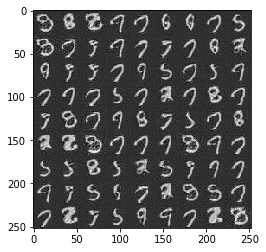


Epoch:10/10 Time: 1:50:53 s. st_Tm: 0:00:51 s. #Steps:4512, DLoss: 0.0473 GLoss: 3.6178 guess:  11m. average:  13m.
Epoch:10/10 Time: 1:51:45 s. st_Tm: 0:00:52 s. #Steps:4544, DLoss: 0.1294 GLoss: 3.4675 guess:  11m. average:  13m.
Epoch:10/10 Time: 1:52:35 s. st_Tm: 0:00:50 s. #Steps:4576, DLoss: 0.0471 GLoss: 3.9926 guess:  11m. average:  12m.
Epoch:10/10 Time: 1:53:27 s. st_Tm: 0:00:51 s. #Steps:4608, DLoss: 0.0156 GLoss: 5.6063 guess:  11m. average:  11m.


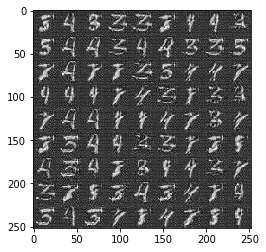

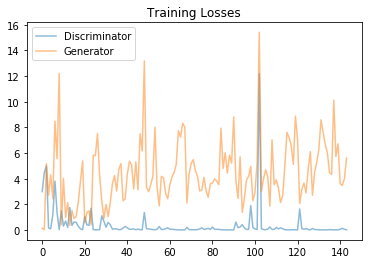

losses saved to:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
Epoch:10/10 Time: 1:54:20 s. st_Tm: 0:00:52 s. #Steps:4640, DLoss: 0.0092 GLoss: 5.6642 guess:  11m. average:  11m.
Epoch:10/10 Time: 1:55:08 s. st_Tm: 0:00:48 s. #Steps:4672, DLoss: 0.0047 GLoss: 6.4973 guess:  12m. average:  11m.
checkpoint saved


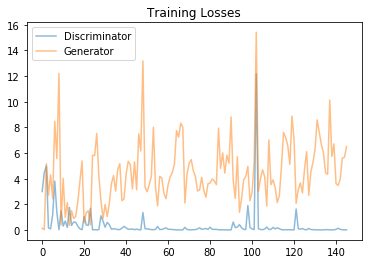

5
4
3
2
1


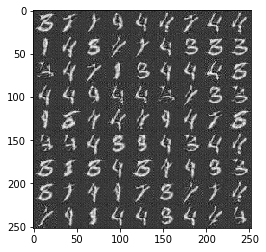

5
4
3
2
1


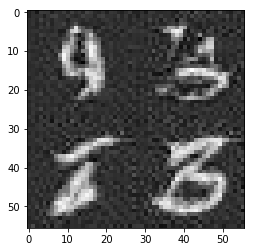

5
4
3
2
1


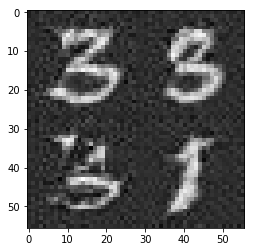

pickle should open:  ./pkl-files/saved_var_checkpoint/MNIST_run.pkl
finished training 10 epochs


In [16]:
"""
# GLOBAL VAR 
- rather than changing the params train() uses - I added these params as global 
- which I know is not strictly right, but it works for me.
"""
# std. Hyper param
batch_size    = 128
z_dim         = 100

# I created a spreadsheet to try and understand beta1, beta2, m_0, v_0 - ended up with a 40* higher lr
# I can't say anything other than: these hyperparam worked for me - hope they will for you too.
learning_rate = 0.002
beta1         = 0.5

# to seperate the two data-runs, I will have to give the files different names 
filename      = 'MNIST_run'
Load_chk      = True      # False  set this to [True], if you want to load the checkpoint and ass. losses-file

# https://medium.com/towards-data-science/gan-by-example-using-keras-on-tensorflow-backend-1a6d515a60d0
Gkeep_prob      = 0.5          # more drops, lower keep prob, but with fewer D_O layers (only in the dense)
Dkeep_prob      = 0.4          # lower keep -> to stabilize & weaken D -> to strengthen G

num_mv_avg      =  12 
steps_printline =  32 
steps_images    = 128 

steps_graph     = 256 

# ran 10 previously - now run another 10
epochs          = 10

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
#epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

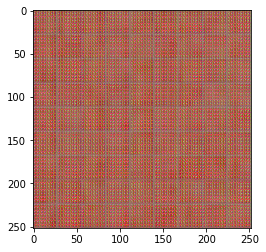


Epoch: 1/10 Time: 0:01:06 s. st_Tm: 0:01:06 s. #Steps:  32, DLoss: 4.6838 GLoss: 7.1381 guess:  11m. average:  11m.
Epoch: 1/10 Time: 0:02:05 s. st_Tm: 0:00:59 s. #Steps:  64, DLoss: 0.6275 GLoss: 2.3738 guess:  21m. average:  16m.
Epoch: 1/10 Time: 0:03:05 s. st_Tm: 0:00:59 s. #Steps:  96, DLoss: 3.6485 GLoss: 0.4841 guess:  31m. average:  21m.
Epoch: 1/10 Time: 0:04:05 s. st_Tm: 0:01:00 s. #Steps: 128, DLoss: 0.5909 GLoss: 1.2872 guess:  41m. average:  26m.
Epoch: 1/10 Time: 0:05:04 s. st_Tm: 0:00:59 s. #Steps: 160, DLoss: 0.6109 GLoss: 4.4195 guess:  51m. average:  31m.
Epoch: 1/10 Time: 0:06:04 s. st_Tm: 0:00:59 s. #Steps: 192, DLoss: 1.8255 GLoss: 0.3493 guess:  61m. average:  36m.
Epoch: 1/10 Time: 0:07:04 s. st_Tm: 0:01:00 s. #Steps: 224, DLoss: 1.7650 GLoss: 1.2596 guess:  71m. average:  41m.
Epoch: 1/10 Time: 0:08:05 s. st_Tm: 0:01:01 s. #Steps: 256, DLoss: 0.8849 GLoss: 2.1045 guess:  81m. average:  46m.


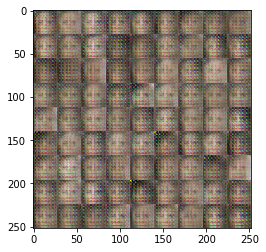


Epoch: 1/10 Time: 0:09:06 s. st_Tm: 0:01:00 s. #Steps: 288, DLoss: 1.6478 GLoss: 0.6935 guess:  91m. average:  51m.
Epoch: 1/10 Time: 0:10:05 s. st_Tm: 0:00:59 s. #Steps: 320, DLoss: 1.8643 GLoss: 0.7403 guess: 101m. average:  56m.
Epoch: 1/10 Time: 0:11:05 s. st_Tm: 0:00:59 s. #Steps: 352, DLoss: 1.5494 GLoss: 0.6983 guess: 111m. average:  61m.
Epoch: 1/10 Time: 0:12:04 s. st_Tm: 0:00:59 s. #Steps: 384, DLoss: 1.4100 GLoss: 0.8426 guess: 121m. average:  66m.
Epoch: 1/10 Time: 0:13:03 s. st_Tm: 0:00:59 s. #Steps: 416, DLoss: 1.6658 GLoss: 0.6738 guess: 131m. average:  71m.
Epoch: 1/10 Time: 0:14:05 s. st_Tm: 0:01:01 s. #Steps: 448, DLoss: 1.8124 GLoss: 0.5448 guess: 141m. average:  76m.
Epoch: 1/10 Time: 0:15:05 s. st_Tm: 0:00:59 s. #Steps: 480, DLoss: 1.6324 GLoss: 1.1361 guess: 151m. average:  81m.
Epoch: 1/10 Time: 0:16:04 s. st_Tm: 0:00:59 s. #Steps: 512, DLoss: 1.6228 GLoss: 0.5525 guess: 161m. average:  86m.


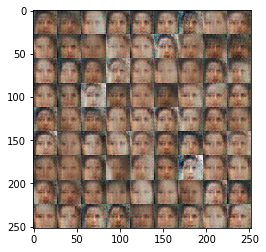

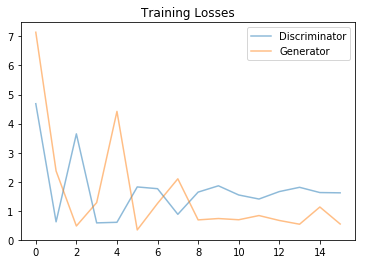

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 1/10 Time: 0:17:04 s. st_Tm: 0:01:00 s. #Steps: 544, DLoss: 1.4855 GLoss: 0.7438 guess: 171m. average:  91m.
Epoch: 1/10 Time: 0:18:04 s. st_Tm: 0:00:59 s. #Steps: 576, DLoss: 1.7328 GLoss: 0.8635 guess: 181m. average:  96m.
Epoch: 1/10 Time: 0:19:04 s. st_Tm: 0:00:59 s. #Steps: 608, DLoss: 1.3885 GLoss: 0.6944 guess: 191m. average: 101m.
Epoch: 1/10 Time: 0:20:04 s. st_Tm: 0:01:00 s. #Steps: 640, DLoss: 1.5489 GLoss: 0.4186 guess: 201m. average: 106m.
Epoch: 1/10 Time: 0:21:04 s. st_Tm: 0:00:59 s. #Steps: 672, DLoss: 1.8736 GLoss: 0.3127 guess: 211m. average: 111m.
Epoch: 1/10 Time: 0:22:04 s. st_Tm: 0:01:00 s. #Steps: 704, DLoss: 1.9148 GLoss: 0.2122 guess: 221m. average: 116m.
Epoch: 1/10 Time: 0:23:04 s. st_Tm: 0:00:59 s. #Steps: 736, DLoss: 1.5499 GLoss: 0.8832 guess: 231m. average: 121m.
Epoch: 1/10 Time: 0:24:03 s. st_Tm: 0:00:59 s. #Steps: 768, DLoss: 1.4163 GLoss: 0.7653 guess: 241m. average: 126m.


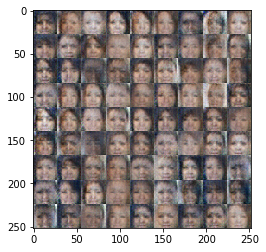


Epoch: 1/10 Time: 0:25:04 s. st_Tm: 0:01:00 s. #Steps: 800, DLoss: 1.4535 GLoss: 0.5268 guess: 251m. average: 131m.
Epoch: 1/10 Time: 0:26:03 s. st_Tm: 0:00:59 s. #Steps: 832, DLoss: 1.4551 GLoss: 0.7430 guess: 261m. average: 141m.
Epoch: 1/10 Time: 0:27:03 s. st_Tm: 0:01:00 s. #Steps: 864, DLoss: 1.4611 GLoss: 0.6038 guess: 271m. average: 151m.
Epoch: 1/10 Time: 0:28:04 s. st_Tm: 0:01:00 s. #Steps: 896, DLoss: 1.4723 GLoss: 1.1157 guess: 281m. average: 161m.
Epoch: 1/10 Time: 0:29:03 s. st_Tm: 0:00:59 s. #Steps: 928, DLoss: 1.6671 GLoss: 0.3692 guess: 291m. average: 171m.
Epoch: 1/10 Time: 0:30:03 s. st_Tm: 0:01:00 s. #Steps: 960, DLoss: 1.6694 GLoss: 0.3018 guess: 301m. average: 181m.
Epoch: 1/10 Time: 0:31:03 s. st_Tm: 0:00:59 s. #Steps: 992, DLoss: 1.1606 GLoss: 0.8704 guess: 311m. average: 191m.
Epoch: 1/10 Time: 0:32:03 s. st_Tm: 0:00:59 s. #Steps:1024, DLoss: 1.5389 GLoss: 0.8980 guess: 321m. average: 201m.


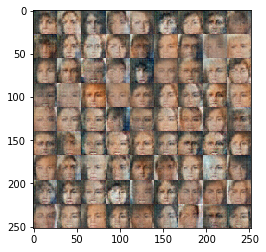

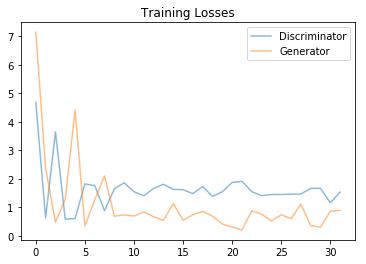

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 1/10 Time: 0:33:03 s. st_Tm: 0:01:00 s. #Steps:1056, DLoss: 1.5893 GLoss: 0.4611 guess: 331m. average: 211m.
Epoch: 1/10 Time: 0:34:03 s. st_Tm: 0:00:59 s. #Steps:1088, DLoss: 1.6330 GLoss: 0.5101 guess: 341m. average: 221m.
Epoch: 1/10 Time: 0:35:02 s. st_Tm: 0:00:59 s. #Steps:1120, DLoss: 1.4879 GLoss: 0.5379 guess: 350m. average: 231m.
Epoch: 1/10 Time: 0:36:02 s. st_Tm: 0:00:59 s. #Steps:1152, DLoss: 1.6987 GLoss: 0.3045 guess: 360m. average: 241m.
Epoch: 1/10 Time: 0:37:01 s. st_Tm: 0:00:59 s. #Steps:1184, DLoss: 1.5345 GLoss: 0.3626 guess: 370m. average: 251m.
Epoch: 1/10 Time: 0:38:01 s. st_Tm: 0:00:59 s. #Steps:1216, DLoss: 1.5492 GLoss: 1.6487 guess: 380m. average: 261m.
Epoch: 1/10 Time: 0:39:00 s. st_Tm: 0:00:59 s. #Steps:1248, DLoss: 1.5065 GLoss: 0.5206 guess: 390m. average: 271m.
Epoch: 1/10 Time: 0:40:00 s. st_Tm: 0:01:00 s. #Steps:1280, DLoss: 1.6787 GLoss: 0.3415 guess: 400m. average: 281m.


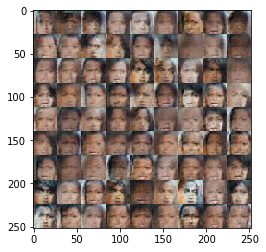


Epoch: 1/10 Time: 0:41:02 s. st_Tm: 0:01:01 s. #Steps:1312, DLoss: 1.3527 GLoss: 0.5793 guess: 410m. average: 291m.
Epoch: 1/10 Time: 0:42:02 s. st_Tm: 0:01:00 s. #Steps:1344, DLoss: 1.4624 GLoss: 0.6228 guess: 420m. average: 301m.
Epoch: 1/10 Time: 0:43:01 s. st_Tm: 0:00:59 s. #Steps:1376, DLoss: 1.7372 GLoss: 0.3759 guess: 430m. average: 311m.
Epoch: 1/10 Time: 0:44:01 s. st_Tm: 0:00:59 s. #Steps:1408, DLoss: 1.5023 GLoss: 0.6685 guess: 440m. average: 321m.
Epoch: 1/10 Time: 0:45:02 s. st_Tm: 0:01:00 s. #Steps:1440, DLoss: 1.3262 GLoss: 0.5280 guess: 450m. average: 330m.
Epoch: 1/10 Time: 0:46:02 s. st_Tm: 0:01:00 s. #Steps:1472, DLoss: 1.5991 GLoss: 0.3647 guess: 460m. average: 340m.
Epoch: 1/10 Time: 0:47:03 s. st_Tm: 0:01:01 s. #Steps:1504, DLoss: 1.7353 GLoss: 0.4373 guess: 471m. average: 350m.
Epoch: 1/10 Time: 0:48:04 s. st_Tm: 0:01:00 s. #Steps:1536, DLoss: 1.2994 GLoss: 1.4145 guess: 481m. average: 360m.


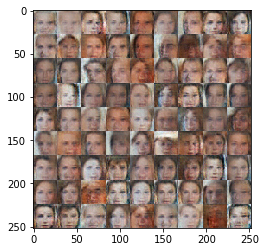

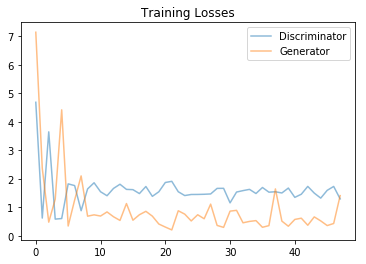

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 1/10 Time: 0:49:05 s. st_Tm: 0:01:00 s. #Steps:1568, DLoss: 1.6664 GLoss: 0.3233 guess: 491m. average: 370m.
Epoch: 2/10 Time: 0:50:00 s. st_Tm: 0:00:55 s. #Steps:1600, DLoss: 1.5586 GLoss: 0.6132 guess: 225m. average: 369m.
Epoch: 2/10 Time: 0:50:52 s. st_Tm: 0:00:52 s. #Steps:1632, DLoss: 1.3015 GLoss: 2.3568 guess: 229m. average: 368m.
Epoch: 2/10 Time: 0:51:48 s. st_Tm: 0:00:55 s. #Steps:1664, DLoss: 1.2311 GLoss: 0.8292 guess: 233m. average: 367m.
Epoch: 2/10 Time: 0:52:42 s. st_Tm: 0:00:53 s. #Steps:1696, DLoss: 1.6617 GLoss: 0.3254 guess: 237m. average: 365m.
Epoch: 2/10 Time: 0:53:34 s. st_Tm: 0:00:52 s. #Steps:1728, DLoss: 1.5835 GLoss: 0.3890 guess: 241m. average: 363m.
Epoch: 2/10 Time: 0:54:26 s. st_Tm: 0:00:52 s. #Steps:1760, DLoss: 1.6140 GLoss: 0.3369 guess: 245m. average: 361m.
Epoch: 2/10 Time: 0:55:18 s. st_Tm: 0:00:51 s. #Steps:1792, DLoss: 2.0194 GLoss: 1.2570 guess: 249m. average: 358m.


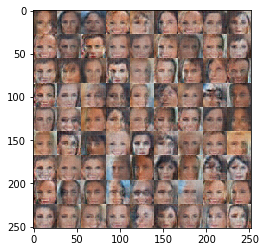


Epoch: 2/10 Time: 0:56:11 s. st_Tm: 0:00:53 s. #Steps:1824, DLoss: 1.7519 GLoss: 0.3283 guess: 253m. average: 356m.
Epoch: 2/10 Time: 0:57:04 s. st_Tm: 0:00:52 s. #Steps:1856, DLoss: 1.2855 GLoss: 1.7935 guess: 257m. average: 353m.
Epoch: 2/10 Time: 0:57:56 s. st_Tm: 0:00:52 s. #Steps:1888, DLoss: 1.5509 GLoss: 0.4475 guess: 261m. average: 349m.
Epoch: 2/10 Time: 0:58:49 s. st_Tm: 0:00:52 s. #Steps:1920, DLoss: 1.7154 GLoss: 0.4300 guess: 265m. average: 346m.
Epoch: 2/10 Time: 0:59:41 s. st_Tm: 0:00:52 s. #Steps:1952, DLoss: 1.3999 GLoss: 0.7531 guess: 269m. average: 342m.
Epoch: 2/10 Time: 1:00:33 s. st_Tm: 0:00:52 s. #Steps:1984, DLoss: 1.2354 GLoss: 0.7386 guess: 273m. average: 338m.
Epoch: 2/10 Time: 1:01:25 s. st_Tm: 0:00:52 s. #Steps:2016, DLoss: 1.3719 GLoss: 0.5153 guess: 276m. average: 334m.
Epoch: 2/10 Time: 1:02:17 s. st_Tm: 0:00:51 s. #Steps:2048, DLoss: 1.7949 GLoss: 0.2421 guess: 280m. average: 330m.


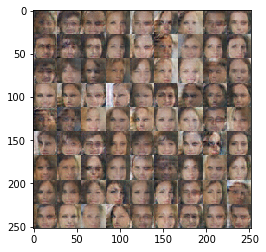

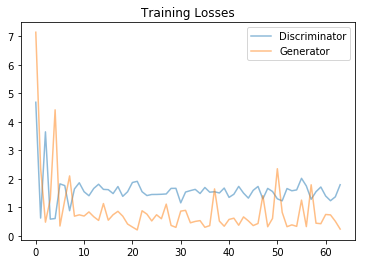

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 2/10 Time: 1:03:10 s. st_Tm: 0:00:52 s. #Steps:2080, DLoss: 1.5176 GLoss: 0.3978 guess: 284m. average: 325m.
Epoch: 2/10 Time: 1:04:02 s. st_Tm: 0:00:52 s. #Steps:2112, DLoss: 1.3768 GLoss: 0.6707 guess: 288m. average: 320m.
Epoch: 2/10 Time: 1:04:55 s. st_Tm: 0:00:52 s. #Steps:2144, DLoss: 1.4242 GLoss: 0.4178 guess: 292m. average: 315m.
Epoch: 2/10 Time: 1:05:47 s. st_Tm: 0:00:52 s. #Steps:2176, DLoss: 1.2102 GLoss: 1.4852 guess: 296m. average: 310m.
Epoch: 2/10 Time: 1:06:39 s. st_Tm: 0:00:51 s. #Steps:2208, DLoss: 0.9484 GLoss: 1.2809 guess: 300m. average: 304m.
Epoch: 2/10 Time: 1:07:31 s. st_Tm: 0:00:52 s. #Steps:2240, DLoss: 0.9497 GLoss: 1.6680 guess: 304m. average: 298m.
Epoch: 2/10 Time: 1:08:23 s. st_Tm: 0:00:52 s. #Steps:2272, DLoss: 1.7222 GLoss: 0.2630 guess: 308m. average: 292m.
Epoch: 2/10 Time: 1:09:14 s. st_Tm: 0:00:51 s. #Steps:2304, DLoss: 1.7642 GLoss: 0.2523 guess: 312m. average: 286m.


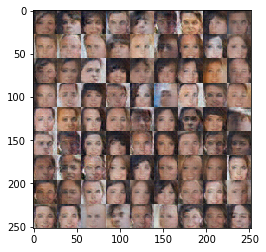


Epoch: 2/10 Time: 1:10:07 s. st_Tm: 0:00:52 s. #Steps:2336, DLoss: 1.6860 GLoss: 0.2924 guess: 316m. average: 279m.
Epoch: 2/10 Time: 1:10:58 s. st_Tm: 0:00:51 s. #Steps:2368, DLoss: 1.2248 GLoss: 1.6177 guess: 319m. average: 272m.
Epoch: 2/10 Time: 1:11:50 s. st_Tm: 0:00:51 s. #Steps:2400, DLoss: 2.0215 GLoss: 0.1720 guess: 323m. average: 276m.
Epoch: 2/10 Time: 1:12:41 s. st_Tm: 0:00:51 s. #Steps:2432, DLoss: 2.1710 GLoss: 0.1708 guess: 327m. average: 280m.
Epoch: 2/10 Time: 1:13:33 s. st_Tm: 0:00:51 s. #Steps:2464, DLoss: 0.8503 GLoss: 1.2496 guess: 331m. average: 284m.
Epoch: 2/10 Time: 1:14:25 s. st_Tm: 0:00:51 s. #Steps:2496, DLoss: 1.1327 GLoss: 0.7895 guess: 335m. average: 288m.
Epoch: 2/10 Time: 1:15:16 s. st_Tm: 0:00:51 s. #Steps:2528, DLoss: 2.3952 GLoss: 2.0323 guess: 339m. average: 292m.
Epoch: 2/10 Time: 1:16:07 s. st_Tm: 0:00:50 s. #Steps:2560, DLoss: 0.7540 GLoss: 2.0182 guess: 343m. average: 296m.


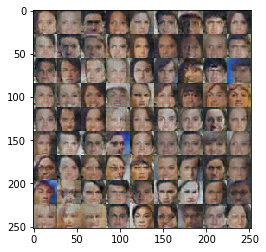

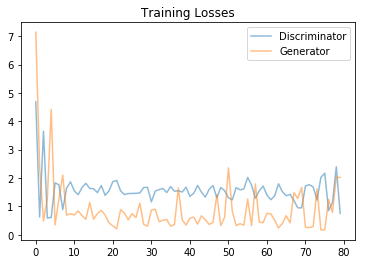

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 2/10 Time: 1:16:59 s. st_Tm: 0:00:52 s. #Steps:2592, DLoss: 1.9914 GLoss: 0.1820 guess: 346m. average: 300m.
Epoch: 2/10 Time: 1:17:50 s. st_Tm: 0:00:50 s. #Steps:2624, DLoss: 0.6025 GLoss: 2.4907 guess: 350m. average: 304m.
Epoch: 2/10 Time: 1:18:41 s. st_Tm: 0:00:51 s. #Steps:2656, DLoss: 1.0855 GLoss: 0.6545 guess: 354m. average: 308m.
Epoch: 2/10 Time: 1:19:33 s. st_Tm: 0:00:52 s. #Steps:2688, DLoss: 1.3700 GLoss: 0.3793 guess: 358m. average: 312m.
Epoch: 2/10 Time: 1:20:25 s. st_Tm: 0:00:51 s. #Steps:2720, DLoss: 1.0532 GLoss: 0.7838 guess: 362m. average: 315m.
Epoch: 2/10 Time: 1:21:17 s. st_Tm: 0:00:51 s. #Steps:2752, DLoss: 1.5900 GLoss: 0.2859 guess: 366m. average: 319m.
Epoch: 2/10 Time: 1:22:08 s. st_Tm: 0:00:51 s. #Steps:2784, DLoss: 1.1141 GLoss: 2.8714 guess: 370m. average: 323m.
Epoch: 2/10 Time: 1:23:00 s. st_Tm: 0:00:51 s. #Steps:2816, DLoss: 1.9422 GLoss: 0.2077 guess: 374m. average: 327m.


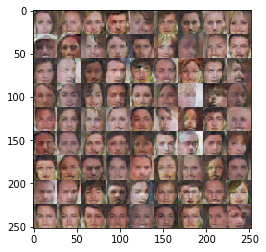


Epoch: 2/10 Time: 1:23:54 s. st_Tm: 0:00:53 s. #Steps:2848, DLoss: 1.8156 GLoss: 0.2199 guess: 378m. average: 331m.
Epoch: 2/10 Time: 1:24:46 s. st_Tm: 0:00:52 s. #Steps:2880, DLoss: 1.1323 GLoss: 0.7812 guess: 381m. average: 335m.
Epoch: 2/10 Time: 1:25:38 s. st_Tm: 0:00:51 s. #Steps:2912, DLoss: 1.2878 GLoss: 0.4858 guess: 385m. average: 339m.
Epoch: 2/10 Time: 1:26:29 s. st_Tm: 0:00:51 s. #Steps:2944, DLoss: 1.7708 GLoss: 0.2453 guess: 389m. average: 343m.
Epoch: 2/10 Time: 1:27:21 s. st_Tm: 0:00:51 s. #Steps:2976, DLoss: 1.6115 GLoss: 0.3703 guess: 393m. average: 346m.
Epoch: 2/10 Time: 1:28:13 s. st_Tm: 0:00:51 s. #Steps:3008, DLoss: 1.7261 GLoss: 0.2618 guess: 397m. average: 350m.
Epoch: 2/10 Time: 1:29:04 s. st_Tm: 0:00:51 s. #Steps:3040, DLoss: 0.9378 GLoss: 1.5495 guess: 401m. average: 354m.
Epoch: 2/10 Time: 1:29:56 s. st_Tm: 0:00:51 s. #Steps:3072, DLoss: 0.6265 GLoss: 1.8050 guess: 405m. average: 358m.


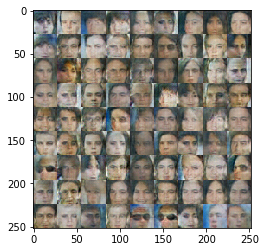

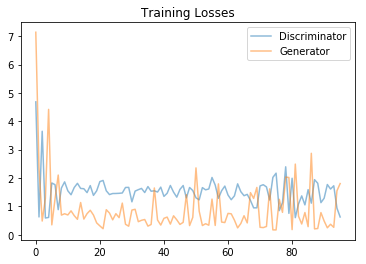

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 2/10 Time: 1:30:48 s. st_Tm: 0:00:52 s. #Steps:3104, DLoss: 1.2688 GLoss: 0.4910 guess: 409m. average: 362m.
Epoch: 2/10 Time: 1:31:39 s. st_Tm: 0:00:51 s. #Steps:3136, DLoss: 1.5098 GLoss: 0.3715 guess: 412m. average: 366m.
Epoch: 3/10 Time: 1:32:31 s. st_Tm: 0:00:52 s. #Steps:3168, DLoss: 1.6636 GLoss: 0.2945 guess: 247m. average: 363m.
Epoch: 3/10 Time: 1:33:22 s. st_Tm: 0:00:51 s. #Steps:3200, DLoss: 1.5023 GLoss: 0.3437 guess: 249m. average: 360m.
Epoch: 3/10 Time: 1:34:14 s. st_Tm: 0:00:51 s. #Steps:3232, DLoss: 0.7573 GLoss: 2.6423 guess: 251m. average: 357m.
Epoch: 3/10 Time: 1:35:06 s. st_Tm: 0:00:51 s. #Steps:3264, DLoss: 1.7373 GLoss: 0.2435 guess: 254m. average: 354m.
Epoch: 3/10 Time: 1:35:58 s. st_Tm: 0:00:52 s. #Steps:3296, DLoss: 1.3931 GLoss: 1.2830 guess: 256m. average: 351m.
Epoch: 3/10 Time: 1:36:51 s. st_Tm: 0:00:52 s. #Steps:3328, DLoss: 0.8791 GLoss: 0.7965 guess: 258m. average: 348m.


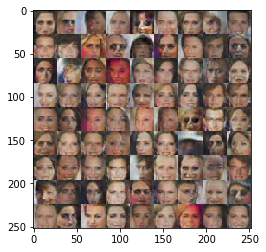


Epoch: 3/10 Time: 1:37:42 s. st_Tm: 0:00:51 s. #Steps:3360, DLoss: 4.0808 GLoss: 3.5601 guess: 261m. average: 344m.
Epoch: 3/10 Time: 1:38:34 s. st_Tm: 0:00:51 s. #Steps:3392, DLoss: 1.5622 GLoss: 0.3146 guess: 263m. average: 341m.
Epoch: 3/10 Time: 1:39:25 s. st_Tm: 0:00:50 s. #Steps:3424, DLoss: 2.4859 GLoss: 0.1160 guess: 265m. average: 337m.
Epoch: 3/10 Time: 1:40:15 s. st_Tm: 0:00:50 s. #Steps:3456, DLoss: 0.9763 GLoss: 0.8406 guess: 267m. average: 334m.
Epoch: 3/10 Time: 1:41:05 s. st_Tm: 0:00:50 s. #Steps:3488, DLoss: 0.3134 GLoss: 2.2265 guess: 270m. average: 330m.
Epoch: 3/10 Time: 1:41:55 s. st_Tm: 0:00:49 s. #Steps:3520, DLoss: 2.8508 GLoss: 0.2787 guess: 272m. average: 327m.
Epoch: 3/10 Time: 1:42:45 s. st_Tm: 0:00:50 s. #Steps:3552, DLoss: 0.9804 GLoss: 0.7081 guess: 274m. average: 323m.
Epoch: 3/10 Time: 1:43:36 s. st_Tm: 0:00:50 s. #Steps:3584, DLoss: 1.6511 GLoss: 0.2884 guess: 276m. average: 319m.


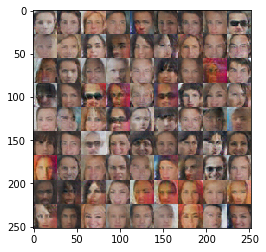

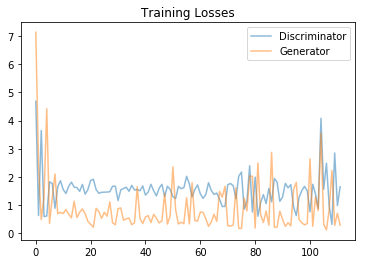

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 3/10 Time: 1:44:27 s. st_Tm: 0:00:50 s. #Steps:3616, DLoss: 2.3644 GLoss: 0.1266 guess: 279m. average: 316m.
Epoch: 3/10 Time: 1:45:17 s. st_Tm: 0:00:50 s. #Steps:3648, DLoss: 0.9764 GLoss: 1.8083 guess: 281m. average: 312m.
Epoch: 3/10 Time: 1:46:07 s. st_Tm: 0:00:50 s. #Steps:3680, DLoss: 0.8616 GLoss: 3.6439 guess: 283m. average: 308m.
Epoch: 3/10 Time: 1:46:58 s. st_Tm: 0:00:50 s. #Steps:3712, DLoss: 1.5407 GLoss: 0.3409 guess: 285m. average: 304m.
Epoch: 3/10 Time: 1:47:48 s. st_Tm: 0:00:50 s. #Steps:3744, DLoss: 0.8871 GLoss: 0.8136 guess: 287m. average: 300m.
Epoch: 3/10 Time: 1:48:38 s. st_Tm: 0:00:50 s. #Steps:3776, DLoss: 1.7519 GLoss: 0.2592 guess: 290m. average: 296m.
Epoch: 3/10 Time: 1:49:28 s. st_Tm: 0:00:50 s. #Steps:3808, DLoss: 0.6730 GLoss: 1.4818 guess: 292m. average: 291m.
Epoch: 3/10 Time: 1:50:19 s. st_Tm: 0:00:50 s. #Steps:3840, DLoss: 2.6761 GLoss: 0.1155 guess: 294m. average: 287m.


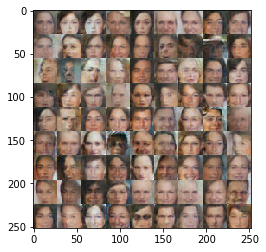


Epoch: 3/10 Time: 1:51:09 s. st_Tm: 0:00:50 s. #Steps:3872, DLoss: 0.9187 GLoss: 0.6718 guess: 296m. average: 283m.
Epoch: 3/10 Time: 1:51:59 s. st_Tm: 0:00:49 s. #Steps:3904, DLoss: 1.6796 GLoss: 0.3047 guess: 299m. average: 278m.
Epoch: 3/10 Time: 1:52:49 s. st_Tm: 0:00:50 s. #Steps:3936, DLoss: 2.9559 GLoss: 0.2051 guess: 301m. average: 274m.
Epoch: 3/10 Time: 1:53:40 s. st_Tm: 0:00:50 s. #Steps:3968, DLoss: 1.3054 GLoss: 0.4556 guess: 303m. average: 276m.
Epoch: 3/10 Time: 1:54:30 s. st_Tm: 0:00:50 s. #Steps:4000, DLoss: 1.6212 GLoss: 0.3028 guess: 305m. average: 278m.
Epoch: 3/10 Time: 1:55:21 s. st_Tm: 0:00:51 s. #Steps:4032, DLoss: 1.0891 GLoss: 0.5877 guess: 308m. average: 281m.
Epoch: 3/10 Time: 1:56:11 s. st_Tm: 0:00:50 s. #Steps:4064, DLoss: 1.8341 GLoss: 0.2296 guess: 310m. average: 283m.
Epoch: 3/10 Time: 1:57:02 s. st_Tm: 0:00:50 s. #Steps:4096, DLoss: 2.9116 GLoss: 0.9988 guess: 312m. average: 285m.


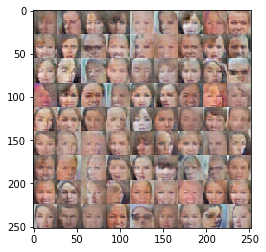

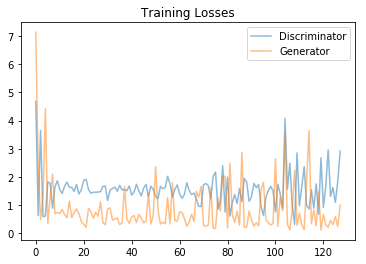

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 3/10 Time: 1:57:54 s. st_Tm: 0:00:52 s. #Steps:4128, DLoss: 0.8634 GLoss: 0.9237 guess: 314m. average: 287m.
Epoch: 3/10 Time: 1:58:44 s. st_Tm: 0:00:50 s. #Steps:4160, DLoss: 0.6796 GLoss: 0.9797 guess: 317m. average: 290m.
Epoch: 3/10 Time: 1:59:34 s. st_Tm: 0:00:49 s. #Steps:4192, DLoss: 0.7975 GLoss: 1.2578 guess: 319m. average: 292m.
Epoch: 3/10 Time: 2:00:24 s. st_Tm: 0:00:50 s. #Steps:4224, DLoss: 1.2819 GLoss: 0.5038 guess: 321m. average: 294m.
Epoch: 3/10 Time: 2:01:15 s. st_Tm: 0:00:50 s. #Steps:4256, DLoss: 0.7763 GLoss: 3.1722 guess: 323m. average: 296m.
Epoch: 3/10 Time: 2:02:05 s. st_Tm: 0:00:50 s. #Steps:4288, DLoss: 0.3851 GLoss: 2.3507 guess: 326m. average: 299m.
Epoch: 3/10 Time: 2:02:55 s. st_Tm: 0:00:49 s. #Steps:4320, DLoss: 0.6051 GLoss: 1.3843 guess: 328m. average: 301m.
Epoch: 3/10 Time: 2:03:46 s. st_Tm: 0:00:50 s. #Steps:4352, DLoss: 0.9881 GLoss: 0.7136 guess: 330m. average: 303m.


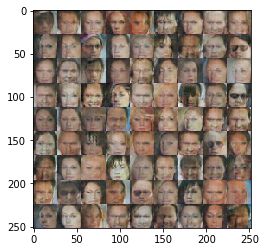


Epoch: 3/10 Time: 2:04:36 s. st_Tm: 0:00:50 s. #Steps:4384, DLoss: 1.7852 GLoss: 0.3287 guess: 332m. average: 305m.
Epoch: 3/10 Time: 2:05:26 s. st_Tm: 0:00:50 s. #Steps:4416, DLoss: 1.4950 GLoss: 0.4017 guess: 335m. average: 308m.
Epoch: 3/10 Time: 2:06:16 s. st_Tm: 0:00:49 s. #Steps:4448, DLoss: 1.3583 GLoss: 0.4195 guess: 337m. average: 310m.
Epoch: 3/10 Time: 2:07:06 s. st_Tm: 0:00:50 s. #Steps:4480, DLoss: 1.2930 GLoss: 4.8995 guess: 339m. average: 312m.
Epoch: 3/10 Time: 2:07:57 s. st_Tm: 0:00:50 s. #Steps:4512, DLoss: 0.4361 GLoss: 1.7730 guess: 341m. average: 314m.
Epoch: 3/10 Time: 2:08:47 s. st_Tm: 0:00:50 s. #Steps:4544, DLoss: 1.0997 GLoss: 0.6352 guess: 343m. average: 317m.
Epoch: 3/10 Time: 2:09:38 s. st_Tm: 0:00:51 s. #Steps:4576, DLoss: 0.2782 GLoss: 2.3420 guess: 346m. average: 319m.
Epoch: 3/10 Time: 2:10:32 s. st_Tm: 0:00:54 s. #Steps:4608, DLoss: 0.6489 GLoss: 1.2006 guess: 348m. average: 321m.


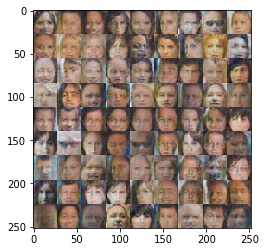

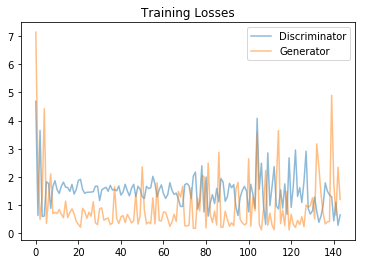

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 3/10 Time: 2:11:28 s. st_Tm: 0:00:55 s. #Steps:4640, DLoss: 0.3077 GLoss: 2.3530 guess: 351m. average: 323m.
Epoch: 3/10 Time: 2:12:22 s. st_Tm: 0:00:54 s. #Steps:4672, DLoss: 0.2682 GLoss: 4.4036 guess: 353m. average: 326m.
Epoch: 3/10 Time: 2:13:15 s. st_Tm: 0:00:53 s. #Steps:4704, DLoss: 0.6545 GLoss: 1.3213 guess: 355m. average: 328m.
Epoch: 3/10 Time: 2:14:11 s. st_Tm: 0:00:55 s. #Steps:4736, DLoss: 1.0821 GLoss: 3.2804 guess: 358m. average: 330m.
Epoch: 4/10 Time: 2:15:05 s. st_Tm: 0:00:54 s. #Steps:4768, DLoss: 1.1213 GLoss: 0.5682 guess: 236m. average: 327m.
Epoch: 4/10 Time: 2:15:59 s. st_Tm: 0:00:54 s. #Steps:4800, DLoss: 0.4012 GLoss: 3.4750 guess: 238m. average: 325m.
Epoch: 4/10 Time: 2:16:53 s. st_Tm: 0:00:53 s. #Steps:4832, DLoss: 1.8363 GLoss: 0.2431 guess: 240m. average: 322m.
Epoch: 4/10 Time: 2:17:46 s. st_Tm: 0:00:53 s. #Steps:4864, DLoss: 2.6308 GLoss: 0.1299 guess: 241m. average: 319m.


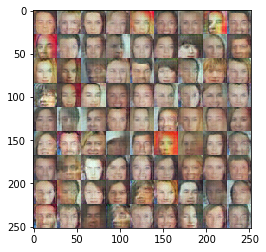


Epoch: 4/10 Time: 2:18:41 s. st_Tm: 0:00:54 s. #Steps:4896, DLoss: 0.7561 GLoss: 1.1194 guess: 243m. average: 317m.
Epoch: 4/10 Time: 2:19:35 s. st_Tm: 0:00:54 s. #Steps:4928, DLoss: 1.2975 GLoss: 5.3173 guess: 244m. average: 314m.
Epoch: 4/10 Time: 2:20:29 s. st_Tm: 0:00:54 s. #Steps:4960, DLoss: 0.6549 GLoss: 1.1187 guess: 246m. average: 311m.
Epoch: 4/10 Time: 2:21:24 s. st_Tm: 0:00:55 s. #Steps:4992, DLoss: 2.7187 GLoss: 0.1362 guess: 247m. average: 308m.
Epoch: 4/10 Time: 2:22:18 s. st_Tm: 0:00:54 s. #Steps:5024, DLoss: 0.6232 GLoss: 1.1943 guess: 249m. average: 305m.
Epoch: 4/10 Time: 2:23:11 s. st_Tm: 0:00:53 s. #Steps:5056, DLoss: 1.7356 GLoss: 0.2692 guess: 251m. average: 302m.
Epoch: 4/10 Time: 2:24:06 s. st_Tm: 0:00:54 s. #Steps:5088, DLoss: 2.5315 GLoss: 0.1237 guess: 252m. average: 299m.
Epoch: 4/10 Time: 2:25:00 s. st_Tm: 0:00:53 s. #Steps:5120, DLoss: 1.3971 GLoss: 0.4383 guess: 254m. average: 296m.


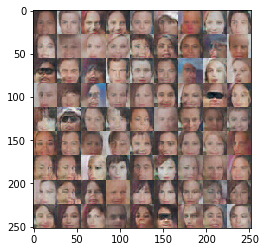

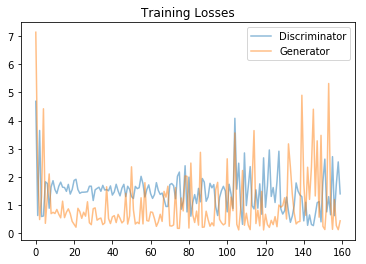

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 4/10 Time: 2:25:54 s. st_Tm: 0:00:54 s. #Steps:5152, DLoss: 1.3465 GLoss: 0.5810 guess: 255m. average: 293m.
Epoch: 4/10 Time: 2:26:48 s. st_Tm: 0:00:54 s. #Steps:5184, DLoss: 1.1080 GLoss: 0.6373 guess: 257m. average: 290m.
Epoch: 4/10 Time: 2:27:41 s. st_Tm: 0:00:53 s. #Steps:5216, DLoss: 0.9877 GLoss: 0.8760 guess: 258m. average: 287m.
Epoch: 4/10 Time: 2:28:37 s. st_Tm: 0:00:55 s. #Steps:5248, DLoss: 2.4236 GLoss: 0.1502 guess: 260m. average: 284m.
Epoch: 4/10 Time: 2:29:31 s. st_Tm: 0:00:53 s. #Steps:5280, DLoss: 1.1315 GLoss: 0.6337 guess: 262m. average: 281m.
Epoch: 4/10 Time: 2:30:24 s. st_Tm: 0:00:53 s. #Steps:5312, DLoss: 0.8261 GLoss: 2.8496 guess: 263m. average: 278m.
Epoch: 4/10 Time: 2:31:18 s. st_Tm: 0:00:53 s. #Steps:5344, DLoss: 1.1724 GLoss: 0.5275 guess: 265m. average: 275m.
Epoch: 4/10 Time: 2:32:13 s. st_Tm: 0:00:54 s. #Steps:5376, DLoss: 0.9621 GLoss: 0.8165 guess: 266m. average: 272m.


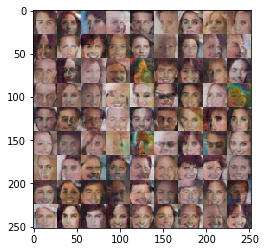


Epoch: 4/10 Time: 2:33:08 s. st_Tm: 0:00:54 s. #Steps:5408, DLoss: 1.3601 GLoss: 0.4341 guess: 268m. average: 269m.
Epoch: 4/10 Time: 2:34:03 s. st_Tm: 0:00:55 s. #Steps:5440, DLoss: 3.8528 GLoss: 0.1033 guess: 270m. average: 265m.
Epoch: 4/10 Time: 2:34:58 s. st_Tm: 0:00:55 s. #Steps:5472, DLoss: 1.3227 GLoss: 0.4686 guess: 271m. average: 262m.
Epoch: 4/10 Time: 2:35:52 s. st_Tm: 0:00:53 s. #Steps:5504, DLoss: 1.6118 GLoss: 0.3397 guess: 273m. average: 259m.
Epoch: 4/10 Time: 2:36:46 s. st_Tm: 0:00:53 s. #Steps:5536, DLoss: 1.3853 GLoss: 0.4150 guess: 274m. average: 255m.
Epoch: 4/10 Time: 2:37:40 s. st_Tm: 0:00:53 s. #Steps:5568, DLoss: 1.2463 GLoss: 0.5446 guess: 276m. average: 257m.
Epoch: 4/10 Time: 2:38:32 s. st_Tm: 0:00:52 s. #Steps:5600, DLoss: 1.4921 GLoss: 0.3950 guess: 277m. average: 259m.
Epoch: 4/10 Time: 2:39:24 s. st_Tm: 0:00:52 s. #Steps:5632, DLoss: 0.5827 GLoss: 3.6979 guess: 279m. average: 260m.


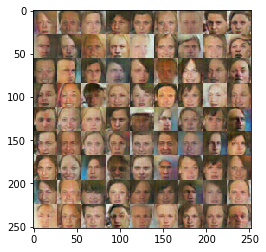

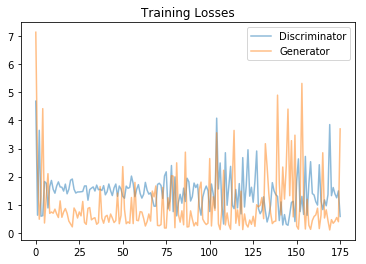

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 4/10 Time: 2:40:17 s. st_Tm: 0:00:53 s. #Steps:5664, DLoss: 1.5050 GLoss: 0.4003 guess: 281m. average: 262m.
Epoch: 4/10 Time: 2:41:09 s. st_Tm: 0:00:51 s. #Steps:5696, DLoss: 1.6678 GLoss: 0.3632 guess: 282m. average: 263m.
Epoch: 4/10 Time: 2:42:02 s. st_Tm: 0:00:52 s. #Steps:5728, DLoss: 0.7994 GLoss: 0.8837 guess: 284m. average: 265m.
Epoch: 4/10 Time: 2:42:53 s. st_Tm: 0:00:51 s. #Steps:5760, DLoss: 0.2986 GLoss: 2.1582 guess: 285m. average: 266m.
Epoch: 4/10 Time: 2:43:45 s. st_Tm: 0:00:52 s. #Steps:5792, DLoss: 0.9319 GLoss: 0.7271 guess: 287m. average: 268m.
Epoch: 4/10 Time: 2:44:37 s. st_Tm: 0:00:51 s. #Steps:5824, DLoss: 1.2781 GLoss: 0.5492 guess: 288m. average: 269m.
Epoch: 4/10 Time: 2:45:29 s. st_Tm: 0:00:52 s. #Steps:5856, DLoss: 1.6170 GLoss: 0.3336 guess: 290m. average: 271m.
Epoch: 4/10 Time: 2:46:21 s. st_Tm: 0:00:51 s. #Steps:5888, DLoss: 1.3541 GLoss: 0.5238 guess: 291m. average: 273m.


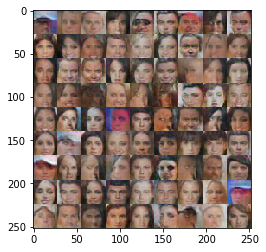


Epoch: 4/10 Time: 2:47:14 s. st_Tm: 0:00:52 s. #Steps:5920, DLoss: 1.2615 GLoss: 0.5121 guess: 293m. average: 274m.
Epoch: 4/10 Time: 2:48:06 s. st_Tm: 0:00:52 s. #Steps:5952, DLoss: 1.9629 GLoss: 0.3580 guess: 294m. average: 276m.
Epoch: 4/10 Time: 2:48:57 s. st_Tm: 0:00:51 s. #Steps:5984, DLoss: 0.4103 GLoss: 2.3007 guess: 296m. average: 277m.
Epoch: 4/10 Time: 2:49:49 s. st_Tm: 0:00:51 s. #Steps:6016, DLoss: 4.4798 GLoss: 9.3102 guess: 297m. average: 279m.
Epoch: 4/10 Time: 2:50:42 s. st_Tm: 0:00:52 s. #Steps:6048, DLoss: 1.4194 GLoss: 0.4196 guess: 299m. average: 280m.
Epoch: 4/10 Time: 2:51:33 s. st_Tm: 0:00:51 s. #Steps:6080, DLoss: 2.0055 GLoss: 0.2106 guess: 300m. average: 282m.
Epoch: 4/10 Time: 2:52:25 s. st_Tm: 0:00:51 s. #Steps:6112, DLoss: 0.7649 GLoss: 0.8350 guess: 302m. average: 283m.
Epoch: 4/10 Time: 2:53:17 s. st_Tm: 0:00:51 s. #Steps:6144, DLoss: 0.2118 GLoss: 2.6921 guess: 303m. average: 285m.


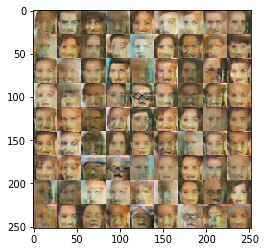

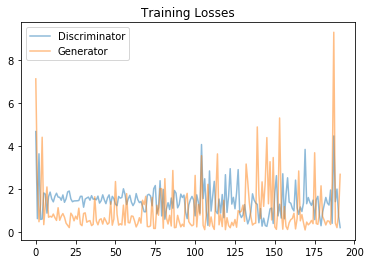

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 4/10 Time: 2:54:10 s. st_Tm: 0:00:52 s. #Steps:6176, DLoss: 0.6230 GLoss: 1.3128 guess: 305m. average: 287m.
Epoch: 4/10 Time: 2:55:02 s. st_Tm: 0:00:52 s. #Steps:6208, DLoss: 1.1779 GLoss: 0.5944 guess: 306m. average: 288m.
Epoch: 4/10 Time: 2:55:54 s. st_Tm: 0:00:51 s. #Steps:6240, DLoss: 0.1223 GLoss: 4.0824 guess: 308m. average: 290m.
Epoch: 4/10 Time: 2:56:46 s. st_Tm: 0:00:52 s. #Steps:6272, DLoss: 1.5338 GLoss: 0.4525 guess: 309m. average: 291m.
Epoch: 4/10 Time: 2:57:38 s. st_Tm: 0:00:51 s. #Steps:6304, DLoss: 0.4149 GLoss: 3.6808 guess: 311m. average: 293m.
Epoch: 5/10 Time: 2:58:30 s. st_Tm: 0:00:51 s. #Steps:6336, DLoss: 1.4490 GLoss: 0.4244 guess: 214m. average: 290m.
Epoch: 5/10 Time: 2:59:22 s. st_Tm: 0:00:51 s. #Steps:6368, DLoss: 1.7396 GLoss: 0.3638 guess: 215m. average: 288m.
Epoch: 5/10 Time: 3:00:14 s. st_Tm: 0:00:52 s. #Steps:6400, DLoss: 0.3596 GLoss: 4.9887 guess: 216m. average: 285m.


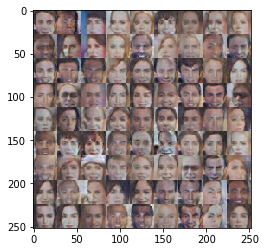


Epoch: 5/10 Time: 3:01:07 s. st_Tm: 0:00:52 s. #Steps:6432, DLoss: 1.2915 GLoss: 6.0766 guess: 217m. average: 283m.
Epoch: 5/10 Time: 3:01:59 s. st_Tm: 0:00:51 s. #Steps:6464, DLoss: 0.5647 GLoss: 1.2695 guess: 218m. average: 280m.
Epoch: 5/10 Time: 3:02:50 s. st_Tm: 0:00:51 s. #Steps:6496, DLoss: 1.2168 GLoss: 0.7655 guess: 219m. average: 278m.
Epoch: 5/10 Time: 3:03:43 s. st_Tm: 0:00:52 s. #Steps:6528, DLoss: 1.7998 GLoss: 8.9435 guess: 220m. average: 275m.
Epoch: 5/10 Time: 3:04:36 s. st_Tm: 0:00:53 s. #Steps:6560, DLoss: 2.1557 GLoss: 0.2722 guess: 222m. average: 273m.
Epoch: 5/10 Time: 3:05:29 s. st_Tm: 0:00:52 s. #Steps:6592, DLoss: 1.4153 GLoss: 8.9131 guess: 223m. average: 270m.
Epoch: 5/10 Time: 3:06:20 s. st_Tm: 0:00:51 s. #Steps:6624, DLoss: 0.5277 GLoss: 5.4520 guess: 224m. average: 268m.
Epoch: 5/10 Time: 3:07:12 s. st_Tm: 0:00:52 s. #Steps:6656, DLoss: 1.5395 GLoss: 0.4448 guess: 225m. average: 265m.


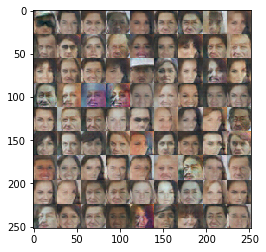

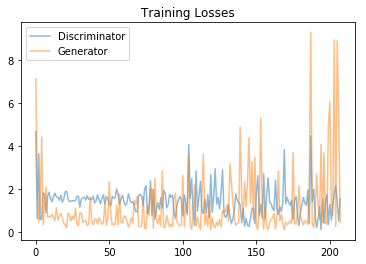

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 5/10 Time: 3:08:05 s. st_Tm: 0:00:52 s. #Steps:6688, DLoss: 3.4992 GLoss: 7.3337 guess: 226m. average: 262m.
Epoch: 5/10 Time: 3:08:57 s. st_Tm: 0:00:52 s. #Steps:6720, DLoss: 0.5243 GLoss: 1.6519 guess: 227m. average: 260m.
Epoch: 5/10 Time: 3:09:49 s. st_Tm: 0:00:51 s. #Steps:6752, DLoss: 1.7567 GLoss: 0.3073 guess: 228m. average: 257m.
Epoch: 5/10 Time: 3:10:41 s. st_Tm: 0:00:51 s. #Steps:6784, DLoss: 0.9287 GLoss: 0.6904 guess: 229m. average: 255m.
Epoch: 5/10 Time: 3:11:32 s. st_Tm: 0:00:51 s. #Steps:6816, DLoss: 0.3404 GLoss: 3.6370 guess: 230m. average: 252m.
Epoch: 5/10 Time: 3:12:25 s. st_Tm: 0:00:52 s. #Steps:6848, DLoss: 1.1480 GLoss: 0.9187 guess: 231m. average: 249m.
Epoch: 5/10 Time: 3:13:16 s. st_Tm: 0:00:51 s. #Steps:6880, DLoss: 0.1181 GLoss: 4.5725 guess: 232m. average: 246m.
Epoch: 5/10 Time: 3:14:08 s. st_Tm: 0:00:51 s. #Steps:6912, DLoss: 1.4225 GLoss: 0.6297 guess: 233m. average: 244m.


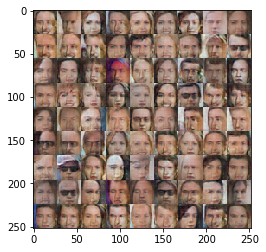


Epoch: 5/10 Time: 3:15:01 s. st_Tm: 0:00:52 s. #Steps:6944, DLoss: 0.8423 GLoss: 1.1644 guess: 234m. average: 241m.
Epoch: 5/10 Time: 3:15:53 s. st_Tm: 0:00:51 s. #Steps:6976, DLoss: 1.3963 GLoss: 0.5344 guess: 235m. average: 238m.
Epoch: 5/10 Time: 3:16:44 s. st_Tm: 0:00:51 s. #Steps:7008, DLoss: 2.3707 GLoss: 0.2204 guess: 236m. average: 235m.
Epoch: 5/10 Time: 3:17:36 s. st_Tm: 0:00:52 s. #Steps:7040, DLoss: 0.6066 GLoss: 1.4495 guess: 237m. average: 232m.
Epoch: 5/10 Time: 3:18:29 s. st_Tm: 0:00:52 s. #Steps:7072, DLoss: 0.4775 GLoss: 1.6723 guess: 238m. average: 230m.
Epoch: 5/10 Time: 3:19:21 s. st_Tm: 0:00:52 s. #Steps:7104, DLoss: 0.1676 GLoss: 2.6488 guess: 239m. average: 227m.
Epoch: 5/10 Time: 3:20:13 s. st_Tm: 0:00:51 s. #Steps:7136, DLoss: 0.2418 GLoss: 2.7615 guess: 240m. average: 228m.
Epoch: 5/10 Time: 3:21:05 s. st_Tm: 0:00:52 s. #Steps:7168, DLoss: 1.2883 GLoss: 0.5756 guess: 241m. average: 229m.


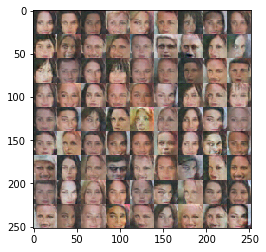

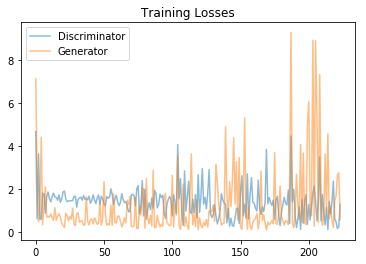

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 5/10 Time: 3:21:57 s. st_Tm: 0:00:52 s. #Steps:7200, DLoss: 0.1185 GLoss: 3.3216 guess: 242m. average: 230m.
Epoch: 5/10 Time: 3:22:49 s. st_Tm: 0:00:51 s. #Steps:7232, DLoss: 0.6478 GLoss: 5.2534 guess: 243m. average: 231m.
Epoch: 5/10 Time: 3:23:41 s. st_Tm: 0:00:51 s. #Steps:7264, DLoss: 0.2492 GLoss: 3.5578 guess: 244m. average: 232m.
Epoch: 5/10 Time: 3:24:33 s. st_Tm: 0:00:51 s. #Steps:7296, DLoss: 0.5034 GLoss: 1.4591 guess: 245m. average: 233m.
Epoch: 5/10 Time: 3:25:25 s. st_Tm: 0:00:52 s. #Steps:7328, DLoss: 0.6955 GLoss: 7.8526 guess: 247m. average: 234m.
Epoch: 5/10 Time: 3:26:17 s. st_Tm: 0:00:52 s. #Steps:7360, DLoss: 0.3971 GLoss: 7.5156 guess: 248m. average: 235m.
Epoch: 5/10 Time: 3:27:09 s. st_Tm: 0:00:51 s. #Steps:7392, DLoss: 0.2903 GLoss: 5.2553 guess: 249m. average: 236m.
Epoch: 5/10 Time: 3:28:00 s. st_Tm: 0:00:51 s. #Steps:7424, DLoss: 0.8051 GLoss: 1.6651 guess: 250m. average: 237m.


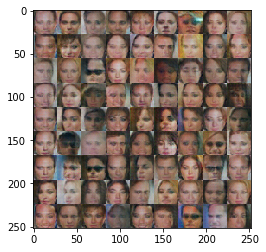


Epoch: 5/10 Time: 3:28:53 s. st_Tm: 0:00:52 s. #Steps:7456, DLoss: 0.7547 GLoss: 1.0202 guess: 251m. average: 238m.
Epoch: 5/10 Time: 3:29:45 s. st_Tm: 0:00:51 s. #Steps:7488, DLoss: 0.6976 GLoss: 1.5573 guess: 252m. average: 239m.
Epoch: 5/10 Time: 3:30:37 s. st_Tm: 0:00:52 s. #Steps:7520, DLoss: 0.8090 GLoss: 1.0933 guess: 253m. average: 240m.
Epoch: 5/10 Time: 3:31:29 s. st_Tm: 0:00:51 s. #Steps:7552, DLoss: 0.6510 GLoss: 6.2277 guess: 254m. average: 241m.
Epoch: 5/10 Time: 3:32:21 s. st_Tm: 0:00:52 s. #Steps:7584, DLoss: 0.4443 GLoss: 1.7155 guess: 255m. average: 242m.
Epoch: 5/10 Time: 3:33:13 s. st_Tm: 0:00:51 s. #Steps:7616, DLoss: 0.9044 GLoss: 1.0231 guess: 256m. average: 243m.
Epoch: 5/10 Time: 3:34:05 s. st_Tm: 0:00:51 s. #Steps:7648, DLoss: 1.9030 GLoss: 0.2846 guess: 257m. average: 244m.
Epoch: 5/10 Time: 3:34:58 s. st_Tm: 0:00:52 s. #Steps:7680, DLoss: 1.0536 GLoss: 0.7433 guess: 258m. average: 245m.


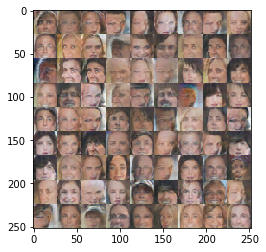

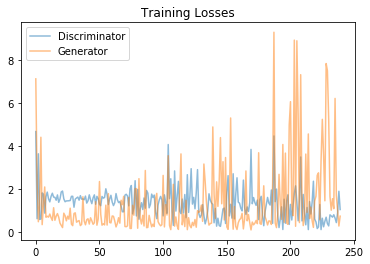

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 5/10 Time: 3:35:50 s. st_Tm: 0:00:52 s. #Steps:7712, DLoss: 1.0737 GLoss: 1.0180 guess: 259m. average: 247m.
Epoch: 5/10 Time: 3:36:44 s. st_Tm: 0:00:53 s. #Steps:7744, DLoss: 0.2990 GLoss: 2.0462 guess: 260m. average: 248m.
Epoch: 5/10 Time: 3:37:35 s. st_Tm: 0:00:51 s. #Steps:7776, DLoss: 2.9302 GLoss: 9.7458 guess: 261m. average: 249m.
Epoch: 5/10 Time: 3:38:27 s. st_Tm: 0:00:51 s. #Steps:7808, DLoss: 1.0934 GLoss: 0.7006 guess: 262m. average: 250m.
Epoch: 5/10 Time: 3:39:19 s. st_Tm: 0:00:51 s. #Steps:7840, DLoss: 0.5831 GLoss: 7.7727 guess: 263m. average: 251m.
Epoch: 5/10 Time: 3:40:11 s. st_Tm: 0:00:52 s. #Steps:7872, DLoss: 2.2959 GLoss: 0.1692 guess: 264m. average: 252m.
Epoch: 5/10 Time: 3:41:04 s. st_Tm: 0:00:52 s. #Steps:7904, DLoss: 0.9653 GLoss: 1.1921 guess: 265m. average: 253m.
Epoch: 6/10 Time: 3:41:56 s. st_Tm: 0:00:51 s. #Steps:7936, DLoss: 0.9739 GLoss: 1.3073 guess: 185m. average: 251m.


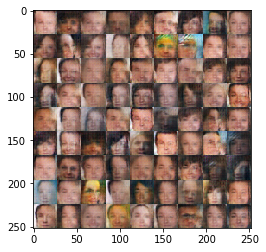


Epoch: 6/10 Time: 3:42:48 s. st_Tm: 0:00:52 s. #Steps:7968, DLoss: 0.8175 GLoss: 7.6907 guess: 186m. average: 248m.
Epoch: 6/10 Time: 3:43:40 s. st_Tm: 0:00:51 s. #Steps:8000, DLoss: 0.3770 GLoss: 1.9715 guess: 186m. average: 246m.
Epoch: 6/10 Time: 3:44:32 s. st_Tm: 0:00:51 s. #Steps:8032, DLoss: 0.3933 GLoss: 2.0620 guess: 187m. average: 244m.
Epoch: 6/10 Time: 3:45:24 s. st_Tm: 0:00:51 s. #Steps:8064, DLoss: 0.3091 GLoss: 1.9471 guess: 188m. average: 242m.
Epoch: 6/10 Time: 3:46:17 s. st_Tm: 0:00:52 s. #Steps:8096, DLoss: 0.2279 GLoss: 6.6975 guess: 189m. average: 239m.
Epoch: 6/10 Time: 3:47:10 s. st_Tm: 0:00:53 s. #Steps:8128, DLoss: 0.0801 GLoss: 9.5483 guess: 189m. average: 237m.
Epoch: 6/10 Time: 3:48:03 s. st_Tm: 0:00:52 s. #Steps:8160, DLoss: 0.4824 GLoss: 3.3772 guess: 190m. average: 235m.
Epoch: 6/10 Time: 3:48:56 s. st_Tm: 0:00:52 s. #Steps:8192, DLoss: 0.0436 GLoss: 8.1433 guess: 191m. average: 232m.


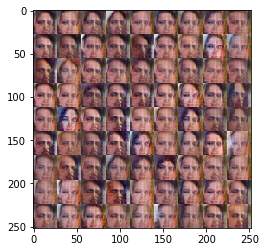

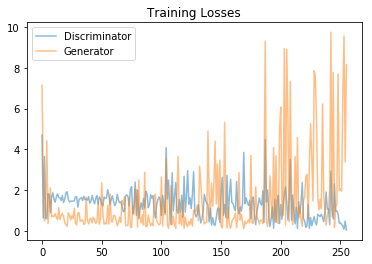

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 6/10 Time: 3:49:49 s. st_Tm: 0:00:53 s. #Steps:8224, DLoss: 1.1241 GLoss: 0.8385 guess: 192m. average: 230m.
Epoch: 6/10 Time: 3:50:42 s. st_Tm: 0:00:52 s. #Steps:8256, DLoss: 1.4332 GLoss:13.0090 guess: 192m. average: 228m.
Epoch: 6/10 Time: 3:51:33 s. st_Tm: 0:00:51 s. #Steps:8288, DLoss: 0.3748 GLoss: 1.6364 guess: 193m. average: 225m.
Epoch: 6/10 Time: 3:52:25 s. st_Tm: 0:00:51 s. #Steps:8320, DLoss: 3.7320 GLoss:19.7193 guess: 194m. average: 223m.
Epoch: 6/10 Time: 3:53:17 s. st_Tm: 0:00:51 s. #Steps:8352, DLoss: 0.2505 GLoss: 2.2300 guess: 194m. average: 221m.
Epoch: 6/10 Time: 3:54:12 s. st_Tm: 0:00:55 s. #Steps:8384, DLoss: 0.3684 GLoss: 3.1217 guess: 195m. average: 218m.
Epoch: 6/10 Time: 3:55:04 s. st_Tm: 0:00:51 s. #Steps:8416, DLoss: 0.3146 GLoss: 4.5561 guess: 196m. average: 216m.
Epoch: 6/10 Time: 3:55:56 s. st_Tm: 0:00:52 s. #Steps:8448, DLoss: 0.2709 GLoss: 2.4822 guess: 197m. average: 213m.


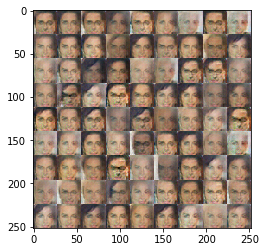


Epoch: 6/10 Time: 3:56:50 s. st_Tm: 0:00:53 s. #Steps:8480, DLoss: 0.2435 GLoss: 2.0450 guess: 197m. average: 211m.
Epoch: 6/10 Time: 3:57:42 s. st_Tm: 0:00:52 s. #Steps:8512, DLoss: 0.2518 GLoss:13.1369 guess: 198m. average: 209m.
Epoch: 6/10 Time: 3:58:36 s. st_Tm: 0:00:53 s. #Steps:8544, DLoss: 0.1278 GLoss: 5.5014 guess: 199m. average: 206m.
Epoch: 6/10 Time: 3:59:28 s. st_Tm: 0:00:52 s. #Steps:8576, DLoss: 0.2845 GLoss: 2.2644 guess: 200m. average: 204m.
Epoch: 6/10 Time: 4:00:20 s. st_Tm: 0:00:52 s. #Steps:8608, DLoss: 0.1599 GLoss:12.4411 guess: 200m. average: 201m.
Epoch: 6/10 Time: 4:01:12 s. st_Tm: 0:00:51 s. #Steps:8640, DLoss: 0.0891 GLoss: 4.3859 guess: 201m. average: 199m.
Epoch: 6/10 Time: 4:02:04 s. st_Tm: 0:00:51 s. #Steps:8672, DLoss: 0.0546 GLoss:15.9140 guess: 202m. average: 196m.
Epoch: 6/10 Time: 4:02:56 s. st_Tm: 0:00:51 s. #Steps:8704, DLoss: 0.1797 GLoss:10.6575 guess: 202m. average: 194m.


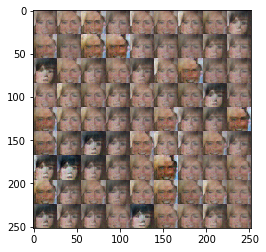

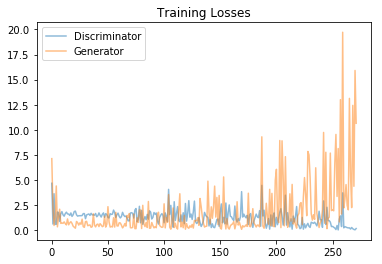

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 6/10 Time: 4:03:48 s. st_Tm: 0:00:52 s. #Steps:8736, DLoss: 0.2361 GLoss: 4.6850 guess: 203m. average: 194m.
Epoch: 6/10 Time: 4:04:40 s. st_Tm: 0:00:51 s. #Steps:8768, DLoss: 0.0525 GLoss: 7.7226 guess: 204m. average: 195m.
Epoch: 6/10 Time: 4:05:32 s. st_Tm: 0:00:51 s. #Steps:8800, DLoss: 0.4105 GLoss: 1.7420 guess: 205m. average: 196m.
Epoch: 6/10 Time: 4:06:24 s. st_Tm: 0:00:51 s. #Steps:8832, DLoss: 0.4251 GLoss: 1.5063 guess: 205m. average: 197m.
Epoch: 6/10 Time: 4:07:16 s. st_Tm: 0:00:51 s. #Steps:8864, DLoss: 0.2767 GLoss: 8.2701 guess: 206m. average: 197m.
Epoch: 6/10 Time: 4:08:08 s. st_Tm: 0:00:52 s. #Steps:8896, DLoss: 0.4452 GLoss: 2.4307 guess: 207m. average: 198m.
Epoch: 6/10 Time: 4:09:00 s. st_Tm: 0:00:52 s. #Steps:8928, DLoss: 0.1595 GLoss: 3.5675 guess: 208m. average: 199m.
Epoch: 6/10 Time: 4:09:53 s. st_Tm: 0:00:52 s. #Steps:8960, DLoss: 0.0393 GLoss: 5.8178 guess: 208m. average: 200m.


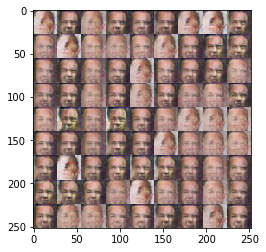


Epoch: 6/10 Time: 4:10:48 s. st_Tm: 0:00:54 s. #Steps:8992, DLoss: 6.1770 GLoss:23.9987 guess: 209m. average: 200m.
Epoch: 6/10 Time: 4:11:40 s. st_Tm: 0:00:51 s. #Steps:9024, DLoss: 0.4275 GLoss: 9.8516 guess: 210m. average: 201m.
Epoch: 6/10 Time: 4:12:31 s. st_Tm: 0:00:51 s. #Steps:9056, DLoss: 0.2968 GLoss: 2.3048 guess: 210m. average: 202m.
Epoch: 6/10 Time: 4:13:22 s. st_Tm: 0:00:51 s. #Steps:9088, DLoss: 0.1898 GLoss: 3.5002 guess: 211m. average: 202m.
Epoch: 6/10 Time: 4:14:14 s. st_Tm: 0:00:51 s. #Steps:9120, DLoss: 0.6005 GLoss: 7.1493 guess: 212m. average: 203m.
Epoch: 6/10 Time: 4:15:06 s. st_Tm: 0:00:51 s. #Steps:9152, DLoss: 0.1488 GLoss: 8.6637 guess: 213m. average: 204m.
Epoch: 6/10 Time: 4:15:57 s. st_Tm: 0:00:51 s. #Steps:9184, DLoss: 0.9920 GLoss: 0.8274 guess: 213m. average: 205m.
Epoch: 6/10 Time: 4:16:49 s. st_Tm: 0:00:51 s. #Steps:9216, DLoss: 0.1905 GLoss: 2.5658 guess: 214m. average: 205m.


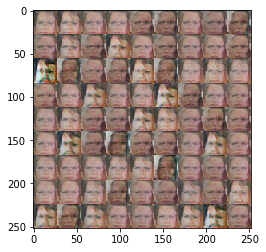

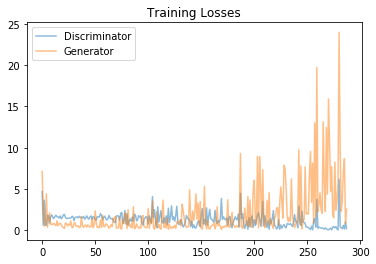

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 6/10 Time: 4:17:41 s. st_Tm: 0:00:52 s. #Steps:9248, DLoss: 1.5498 GLoss:15.3276 guess: 215m. average: 206m.
Epoch: 6/10 Time: 4:18:33 s. st_Tm: 0:00:51 s. #Steps:9280, DLoss: 0.4418 GLoss:11.1213 guess: 215m. average: 207m.
Epoch: 6/10 Time: 4:19:24 s. st_Tm: 0:00:51 s. #Steps:9312, DLoss: 0.0678 GLoss: 6.1662 guess: 216m. average: 208m.
Epoch: 6/10 Time: 4:20:16 s. st_Tm: 0:00:52 s. #Steps:9344, DLoss: 0.1032 GLoss: 4.2611 guess: 217m. average: 208m.
Epoch: 6/10 Time: 4:21:08 s. st_Tm: 0:00:51 s. #Steps:9376, DLoss: 0.2298 GLoss:10.5498 guess: 218m. average: 209m.
Epoch: 6/10 Time: 4:22:00 s. st_Tm: 0:00:51 s. #Steps:9408, DLoss: 0.1279 GLoss: 7.7663 guess: 218m. average: 210m.
Epoch: 6/10 Time: 4:22:51 s. st_Tm: 0:00:51 s. #Steps:9440, DLoss: 0.1803 GLoss: 7.7869 guess: 219m. average: 210m.
Epoch: 6/10 Time: 4:23:43 s. st_Tm: 0:00:51 s. #Steps:9472, DLoss: 0.1317 GLoss: 4.4074 guess: 220m. average: 211m.


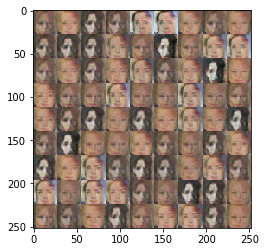


Epoch: 7/10 Time: 4:24:35 s. st_Tm: 0:00:51 s. #Steps:9504, DLoss: 0.0953 GLoss:11.7836 guess: 151m. average: 209m.
Epoch: 7/10 Time: 4:25:26 s. st_Tm: 0:00:51 s. #Steps:9536, DLoss: 0.6487 GLoss: 3.7025 guess: 152m. average: 207m.
Epoch: 7/10 Time: 4:26:17 s. st_Tm: 0:00:51 s. #Steps:9568, DLoss: 0.2010 GLoss: 2.6262 guess: 152m. average: 205m.
Epoch: 7/10 Time: 4:27:09 s. st_Tm: 0:00:51 s. #Steps:9600, DLoss: 0.2261 GLoss: 4.8846 guess: 153m. average: 203m.
Epoch: 7/10 Time: 4:28:01 s. st_Tm: 0:00:51 s. #Steps:9632, DLoss: 0.1891 GLoss: 3.0893 guess: 153m. average: 201m.
Epoch: 7/10 Time: 4:28:53 s. st_Tm: 0:00:51 s. #Steps:9664, DLoss: 0.7307 GLoss: 1.0518 guess: 154m. average: 199m.
Epoch: 7/10 Time: 4:29:44 s. st_Tm: 0:00:51 s. #Steps:9696, DLoss: 0.6273 GLoss:10.7637 guess: 154m. average: 197m.
Epoch: 7/10 Time: 4:30:35 s. st_Tm: 0:00:50 s. #Steps:9728, DLoss: 0.5914 GLoss:12.5547 guess: 155m. average: 194m.


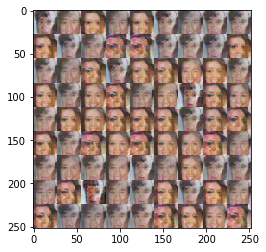

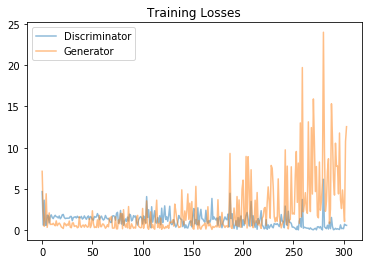

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 7/10 Time: 4:31:30 s. st_Tm: 0:00:54 s. #Steps:9760, DLoss: 0.2687 GLoss:12.2614 guess: 155m. average: 192m.
Epoch: 7/10 Time: 4:32:23 s. st_Tm: 0:00:53 s. #Steps:9792, DLoss: 0.0942 GLoss: 9.0660 guess: 156m. average: 190m.
Epoch: 7/10 Time: 4:33:14 s. st_Tm: 0:00:51 s. #Steps:9824, DLoss: 0.3800 GLoss: 1.8900 guess: 156m. average: 188m.
Epoch: 7/10 Time: 4:34:06 s. st_Tm: 0:00:52 s. #Steps:9856, DLoss: 0.1357 GLoss: 3.7787 guess: 157m. average: 186m.
Epoch: 7/10 Time: 4:34:58 s. st_Tm: 0:00:51 s. #Steps:9888, DLoss: 0.3158 GLoss: 1.5758 guess: 157m. average: 184m.
Epoch: 7/10 Time: 4:35:49 s. st_Tm: 0:00:51 s. #Steps:9920, DLoss: 0.1808 GLoss: 9.8692 guess: 158m. average: 182m.
Epoch: 7/10 Time: 4:36:40 s. st_Tm: 0:00:51 s. #Steps:9952, DLoss: 0.0571 GLoss: 4.2667 guess: 158m. average: 179m.
Epoch: 7/10 Time: 4:37:32 s. st_Tm: 0:00:51 s. #Steps:9984, DLoss: 0.3595 GLoss: 7.6128 guess: 159m. average: 177m.


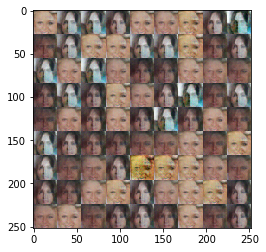


Epoch: 7/10 Time: 4:38:24 s. st_Tm: 0:00:51 s. #Steps:10016, DLoss: 0.2938 GLoss: 3.9652 guess: 159m. average: 175m.
Epoch: 7/10 Time: 4:39:15 s. st_Tm: 0:00:51 s. #Steps:10048, DLoss: 0.6208 GLoss: 1.2092 guess: 160m. average: 173m.
Epoch: 7/10 Time: 4:40:06 s. st_Tm: 0:00:50 s. #Steps:10080, DLoss: 0.2588 GLoss: 4.1156 guess: 160m. average: 171m.
Epoch: 7/10 Time: 4:40:56 s. st_Tm: 0:00:50 s. #Steps:10112, DLoss: 0.9141 GLoss: 4.0589 guess: 161m. average: 168m.
Epoch: 7/10 Time: 4:41:46 s. st_Tm: 0:00:50 s. #Steps:10144, DLoss: 0.4307 GLoss: 1.5253 guess: 161m. average: 166m.
Epoch: 7/10 Time: 4:42:37 s. st_Tm: 0:00:50 s. #Steps:10176, DLoss: 0.0843 GLoss:12.1415 guess: 161m. average: 164m.
Epoch: 7/10 Time: 4:43:27 s. st_Tm: 0:00:49 s. #Steps:10208, DLoss: 0.5104 GLoss: 2.0946 guess: 162m. average: 162m.
Epoch: 7/10 Time: 4:44:17 s. st_Tm: 0:00:50 s. #Steps:10240, DLoss: 0.0877 GLoss: 3.6674 guess: 162m. average: 159m.


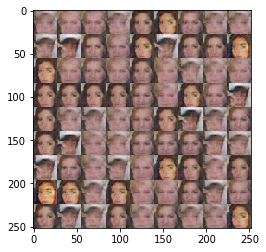

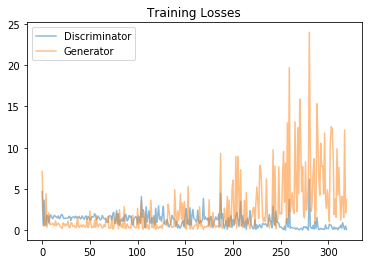

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 7/10 Time: 4:45:08 s. st_Tm: 0:00:51 s. #Steps:10272, DLoss: 0.1079 GLoss: 5.1376 guess: 163m. average: 157m.
Epoch: 7/10 Time: 4:45:59 s. st_Tm: 0:00:50 s. #Steps:10304, DLoss: 2.3306 GLoss:15.9424 guess: 163m. average: 158m.
Epoch: 7/10 Time: 4:46:49 s. st_Tm: 0:00:50 s. #Steps:10336, DLoss: 1.1379 GLoss:12.5810 guess: 164m. average: 158m.
Epoch: 7/10 Time: 4:47:39 s. st_Tm: 0:00:50 s. #Steps:10368, DLoss: 0.2211 GLoss: 3.7404 guess: 164m. average: 159m.
Epoch: 7/10 Time: 4:48:29 s. st_Tm: 0:00:50 s. #Steps:10400, DLoss: 0.5426 GLoss: 7.8073 guess: 165m. average: 159m.
Epoch: 7/10 Time: 4:49:19 s. st_Tm: 0:00:50 s. #Steps:10432, DLoss: 0.2477 GLoss: 2.1437 guess: 165m. average: 160m.
Epoch: 7/10 Time: 4:50:10 s. st_Tm: 0:00:50 s. #Steps:10464, DLoss: 1.0036 GLoss: 0.5358 guess: 166m. average: 160m.
Epoch: 7/10 Time: 4:51:00 s. st_Tm: 0:00:50 s. #Steps:10496, DLoss: 0.3926 GLoss: 4.1098 guess: 166m. average: 161m

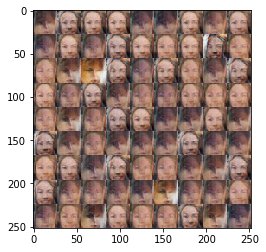


Epoch: 7/10 Time: 4:51:51 s. st_Tm: 0:00:50 s. #Steps:10528, DLoss: 0.2005 GLoss: 4.4830 guess: 167m. average: 161m.
Epoch: 7/10 Time: 4:52:41 s. st_Tm: 0:00:50 s. #Steps:10560, DLoss: 0.1588 GLoss: 4.1998 guess: 167m. average: 161m.
Epoch: 7/10 Time: 4:53:32 s. st_Tm: 0:00:50 s. #Steps:10592, DLoss: 0.6399 GLoss: 2.0015 guess: 168m. average: 162m.
Epoch: 7/10 Time: 4:54:22 s. st_Tm: 0:00:50 s. #Steps:10624, DLoss: 0.0894 GLoss: 4.4574 guess: 168m. average: 162m.
Epoch: 7/10 Time: 4:55:13 s. st_Tm: 0:00:50 s. #Steps:10656, DLoss: 0.3330 GLoss: 2.5841 guess: 169m. average: 163m.
Epoch: 7/10 Time: 4:56:02 s. st_Tm: 0:00:49 s. #Steps:10688, DLoss: 0.0412 GLoss: 4.1623 guess: 169m. average: 163m.
Epoch: 7/10 Time: 4:56:53 s. st_Tm: 0:00:50 s. #Steps:10720, DLoss: 0.1921 GLoss:12.0878 guess: 170m. average: 164m.
Epoch: 7/10 Time: 4:57:43 s. st_Tm: 0:00:50 s. #Steps:10752, DLoss: 0.1523 GLoss: 7.2181 guess: 170m. average: 164m.


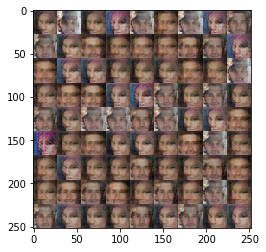

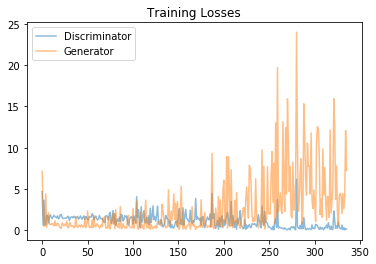

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 7/10 Time: 4:58:34 s. st_Tm: 0:00:50 s. #Steps:10784, DLoss: 0.1868 GLoss: 3.1023 guess: 171m. average: 165m.
Epoch: 7/10 Time: 4:59:25 s. st_Tm: 0:00:50 s. #Steps:10816, DLoss: 0.0479 GLoss:10.3068 guess: 171m. average: 165m.
Epoch: 7/10 Time: 5:00:15 s. st_Tm: 0:00:50 s. #Steps:10848, DLoss: 0.0458 GLoss: 3.7899 guess: 172m. average: 166m.
Epoch: 7/10 Time: 5:01:05 s. st_Tm: 0:00:50 s. #Steps:10880, DLoss: 0.7593 GLoss: 0.8237 guess: 172m. average: 166m.
Epoch: 7/10 Time: 5:01:55 s. st_Tm: 0:00:50 s. #Steps:10912, DLoss: 0.0982 GLoss: 4.2703 guess: 173m. average: 167m.
Epoch: 7/10 Time: 5:02:46 s. st_Tm: 0:00:50 s. #Steps:10944, DLoss: 0.0721 GLoss: 4.7433 guess: 173m. average: 167m.
Epoch: 7/10 Time: 5:03:36 s. st_Tm: 0:00:49 s. #Steps:10976, DLoss: 0.0875 GLoss: 5.1691 guess: 173m. average: 168m.
Epoch: 7/10 Time: 5:04:26 s. st_Tm: 0:00:50 s. #Steps:11008, DLoss: 0.1404 GLoss: 3.1251 guess: 174m. average: 168m

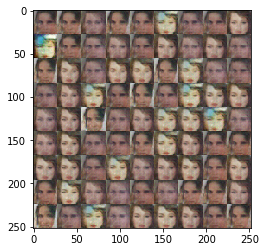


Epoch: 7/10 Time: 5:05:17 s. st_Tm: 0:00:50 s. #Steps:11040, DLoss: 0.3029 GLoss: 3.3286 guess: 174m. average: 169m.
Epoch: 7/10 Time: 5:06:07 s. st_Tm: 0:00:50 s. #Steps:11072, DLoss: 0.0374 GLoss: 5.8128 guess: 175m. average: 169m.
Epoch: 8/10 Time: 5:06:57 s. st_Tm: 0:00:49 s. #Steps:11104, DLoss: 0.1932 GLoss: 4.6932 guess: 115m. average: 167m.
Epoch: 8/10 Time: 5:07:48 s. st_Tm: 0:00:50 s. #Steps:11136, DLoss: 0.0771 GLoss: 8.9961 guess: 115m. average: 165m.
Epoch: 8/10 Time: 5:08:38 s. st_Tm: 0:00:50 s. #Steps:11168, DLoss: 0.2711 GLoss: 5.2560 guess: 116m. average: 163m.
Epoch: 8/10 Time: 5:09:28 s. st_Tm: 0:00:50 s. #Steps:11200, DLoss: 0.4809 GLoss: 3.3715 guess: 116m. average: 161m.
Epoch: 8/10 Time: 5:10:22 s. st_Tm: 0:00:53 s. #Steps:11232, DLoss: 0.2141 GLoss: 5.9603 guess: 116m. average: 159m.
Epoch: 8/10 Time: 5:11:17 s. st_Tm: 0:00:54 s. #Steps:11264, DLoss: 0.0289 GLoss: 5.4466 guess: 117m. average: 157m.


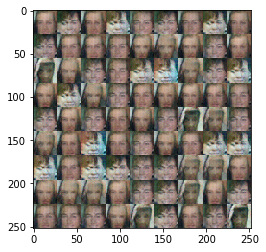

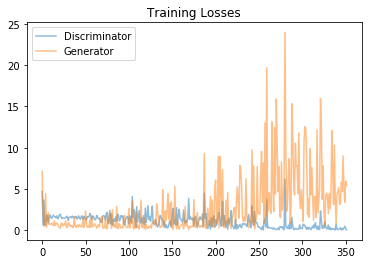

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 8/10 Time: 5:12:13 s. st_Tm: 0:00:55 s. #Steps:11296, DLoss: 0.1920 GLoss: 4.6158 guess: 117m. average: 156m.
Epoch: 8/10 Time: 5:13:08 s. st_Tm: 0:00:54 s. #Steps:11328, DLoss: 0.0263 GLoss: 5.8140 guess: 117m. average: 154m.
Epoch: 8/10 Time: 5:14:02 s. st_Tm: 0:00:54 s. #Steps:11360, DLoss: 0.3399 GLoss: 2.7585 guess: 118m. average: 152m.
Epoch: 8/10 Time: 5:14:57 s. st_Tm: 0:00:54 s. #Steps:11392, DLoss: 0.0918 GLoss: 4.5251 guess: 118m. average: 150m.
Epoch: 8/10 Time: 5:15:52 s. st_Tm: 0:00:55 s. #Steps:11424, DLoss: 0.3678 GLoss: 2.9402 guess: 118m. average: 148m.
Epoch: 8/10 Time: 5:16:50 s. st_Tm: 0:00:57 s. #Steps:11456, DLoss: 0.7194 GLoss:13.6863 guess: 119m. average: 146m.
Epoch: 8/10 Time: 5:17:45 s. st_Tm: 0:00:55 s. #Steps:11488, DLoss: 0.1206 GLoss: 5.1266 guess: 119m. average: 144m.
Epoch: 8/10 Time: 5:18:39 s. st_Tm: 0:00:54 s. #Steps:11520, DLoss: 0.0902 GLoss: 5.0404 guess: 119m. average: 142m

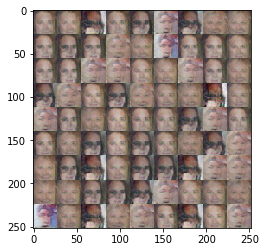


Epoch: 8/10 Time: 5:19:35 s. st_Tm: 0:00:55 s. #Steps:11552, DLoss: 2.0336 GLoss: 0.2269 guess: 120m. average: 140m.
Epoch: 8/10 Time: 5:20:28 s. st_Tm: 0:00:53 s. #Steps:11584, DLoss: 0.1917 GLoss: 7.1498 guess: 120m. average: 138m.
Epoch: 8/10 Time: 5:21:23 s. st_Tm: 0:00:55 s. #Steps:11616, DLoss: 0.4282 GLoss: 1.6997 guess: 121m. average: 136m.
Epoch: 8/10 Time: 5:22:18 s. st_Tm: 0:00:54 s. #Steps:11648, DLoss: 0.2799 GLoss: 7.5260 guess: 121m. average: 134m.
Epoch: 8/10 Time: 5:23:16 s. st_Tm: 0:00:57 s. #Steps:11680, DLoss: 0.1474 GLoss: 7.1770 guess: 121m. average: 131m.
Epoch: 8/10 Time: 5:24:12 s. st_Tm: 0:00:56 s. #Steps:11712, DLoss: 0.0311 GLoss: 6.5569 guess: 122m. average: 129m.
Epoch: 8/10 Time: 5:25:05 s. st_Tm: 0:00:53 s. #Steps:11744, DLoss: 0.2567 GLoss: 2.5559 guess: 122m. average: 127m.
Epoch: 8/10 Time: 5:26:00 s. st_Tm: 0:00:55 s. #Steps:11776, DLoss: 0.0575 GLoss: 4.6941 guess: 122m. average: 125m.


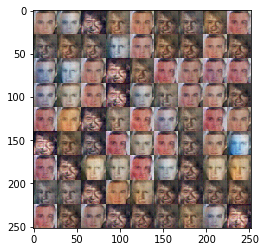

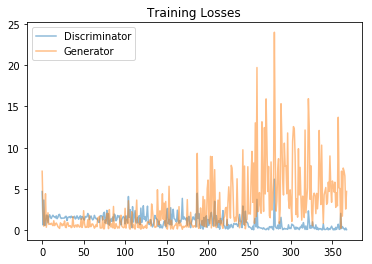

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 8/10 Time: 5:26:56 s. st_Tm: 0:00:55 s. #Steps:11808, DLoss: 0.1543 GLoss: 2.7883 guess: 123m. average: 123m.
Epoch: 8/10 Time: 5:27:51 s. st_Tm: 0:00:55 s. #Steps:11840, DLoss: 0.3234 GLoss: 2.9242 guess: 123m. average: 121m.
Epoch: 8/10 Time: 5:28:46 s. st_Tm: 0:00:54 s. #Steps:11872, DLoss: 0.0442 GLoss: 6.9743 guess: 123m. average: 119m.
Epoch: 8/10 Time: 5:29:39 s. st_Tm: 0:00:53 s. #Steps:11904, DLoss: 0.2636 GLoss: 1.9246 guess: 124m. average: 120m.
Epoch: 8/10 Time: 5:30:33 s. st_Tm: 0:00:53 s. #Steps:11936, DLoss: 0.5381 GLoss: 1.2903 guess: 124m. average: 120m.
Epoch: 8/10 Time: 5:31:27 s. st_Tm: 0:00:54 s. #Steps:11968, DLoss: 0.1700 GLoss: 7.5649 guess: 124m. average: 120m.
Epoch: 8/10 Time: 5:32:22 s. st_Tm: 0:00:54 s. #Steps:12000, DLoss: 0.1372 GLoss: 3.8920 guess: 125m. average: 121m.
Epoch: 8/10 Time: 5:33:17 s. st_Tm: 0:00:55 s. #Steps:12032, DLoss: 0.9447 GLoss: 0.7049 guess: 125m. average: 121m

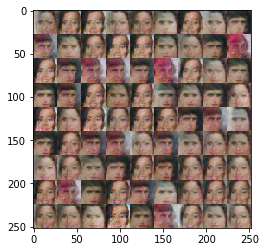


Epoch: 8/10 Time: 5:34:14 s. st_Tm: 0:00:56 s. #Steps:12064, DLoss: 0.3571 GLoss: 2.5436 guess: 125m. average: 121m.
Epoch: 8/10 Time: 5:35:08 s. st_Tm: 0:00:54 s. #Steps:12096, DLoss: 0.1314 GLoss: 6.0814 guess: 126m. average: 122m.
Epoch: 8/10 Time: 5:36:03 s. st_Tm: 0:00:54 s. #Steps:12128, DLoss: 0.3172 GLoss: 2.2097 guess: 126m. average: 122m.
Epoch: 8/10 Time: 5:36:57 s. st_Tm: 0:00:54 s. #Steps:12160, DLoss: 0.1043 GLoss: 5.3546 guess: 126m. average: 122m.
Epoch: 8/10 Time: 5:37:51 s. st_Tm: 0:00:53 s. #Steps:12192, DLoss: 0.2629 GLoss: 3.2801 guess: 127m. average: 123m.
Epoch: 8/10 Time: 5:38:43 s. st_Tm: 0:00:51 s. #Steps:12224, DLoss: 0.4147 GLoss:12.3961 guess: 127m. average: 123m.
Epoch: 8/10 Time: 5:39:35 s. st_Tm: 0:00:52 s. #Steps:12256, DLoss: 0.1704 GLoss: 5.3968 guess: 127m. average: 123m.
Epoch: 8/10 Time: 5:40:28 s. st_Tm: 0:00:52 s. #Steps:12288, DLoss: 0.0997 GLoss: 8.2783 guess: 128m. average: 124m.


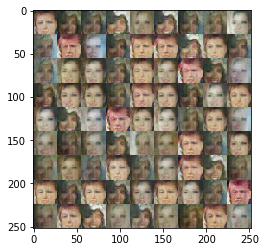

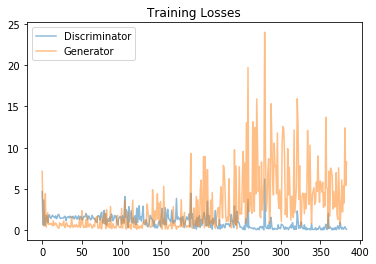

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 8/10 Time: 5:41:21 s. st_Tm: 0:00:52 s. #Steps:12320, DLoss: 0.1218 GLoss: 3.6219 guess: 128m. average: 124m.
Epoch: 8/10 Time: 5:42:13 s. st_Tm: 0:00:52 s. #Steps:12352, DLoss: 0.8125 GLoss: 1.0243 guess: 128m. average: 124m.
Epoch: 8/10 Time: 5:43:05 s. st_Tm: 0:00:52 s. #Steps:12384, DLoss: 0.5902 GLoss: 3.1630 guess: 129m. average: 125m.
Epoch: 8/10 Time: 5:43:57 s. st_Tm: 0:00:52 s. #Steps:12416, DLoss: 0.0111 GLoss: 5.9664 guess: 129m. average: 125m.
Epoch: 8/10 Time: 5:44:49 s. st_Tm: 0:00:52 s. #Steps:12448, DLoss: 0.4532 GLoss: 1.4317 guess: 129m. average: 125m.
Epoch: 8/10 Time: 5:45:41 s. st_Tm: 0:00:51 s. #Steps:12480, DLoss: 0.1244 GLoss: 2.9441 guess: 130m. average: 126m.
Epoch: 8/10 Time: 5:46:34 s. st_Tm: 0:00:52 s. #Steps:12512, DLoss: 0.0507 GLoss: 7.3232 guess: 130m. average: 126m.
Epoch: 8/10 Time: 5:47:26 s. st_Tm: 0:00:52 s. #Steps:12544, DLoss: 0.1406 GLoss: 3.1669 guess: 130m. average: 126m

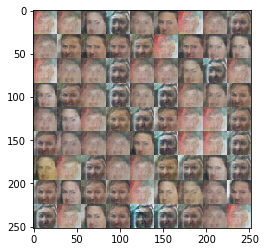


Epoch: 8/10 Time: 5:48:19 s. st_Tm: 0:00:53 s. #Steps:12576, DLoss: 0.1681 GLoss: 7.3833 guess: 131m. average: 127m.
Epoch: 8/10 Time: 5:49:12 s. st_Tm: 0:00:52 s. #Steps:12608, DLoss: 0.1865 GLoss: 4.0713 guess: 131m. average: 127m.
Epoch: 8/10 Time: 5:50:03 s. st_Tm: 0:00:51 s. #Steps:12640, DLoss: 0.0460 GLoss: 4.4010 guess: 131m. average: 127m.
Epoch: 9/10 Time: 5:50:55 s. st_Tm: 0:00:52 s. #Steps:12672, DLoss: 0.2188 GLoss: 8.2523 guess:  78m. average: 126m.
Epoch: 9/10 Time: 5:51:47 s. st_Tm: 0:00:51 s. #Steps:12704, DLoss: 0.1001 GLoss: 6.1458 guess:  78m. average: 124m.
Epoch: 9/10 Time: 5:52:39 s. st_Tm: 0:00:51 s. #Steps:12736, DLoss: 0.0459 GLoss: 4.9508 guess:  78m. average: 122m.
Epoch: 9/10 Time: 5:53:31 s. st_Tm: 0:00:52 s. #Steps:12768, DLoss: 0.0742 GLoss: 6.8248 guess:  79m. average: 120m.
Epoch: 9/10 Time: 5:54:22 s. st_Tm: 0:00:51 s. #Steps:12800, DLoss: 0.3716 GLoss: 2.0953 guess:  79m. average: 118m.


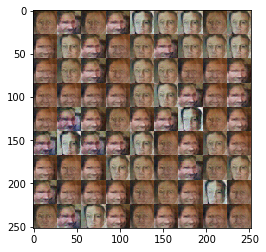

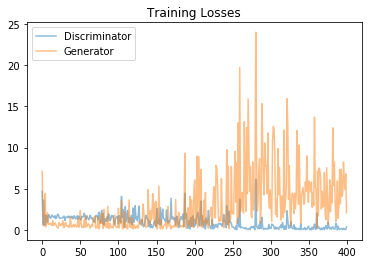

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 9/10 Time: 5:55:15 s. st_Tm: 0:00:52 s. #Steps:12832, DLoss: 0.2147 GLoss: 7.9211 guess:  79m. average: 116m.
Epoch: 9/10 Time: 5:56:07 s. st_Tm: 0:00:51 s. #Steps:12864, DLoss: 0.1090 GLoss: 4.6300 guess:  79m. average: 115m.
Epoch: 9/10 Time: 5:56:59 s. st_Tm: 0:00:52 s. #Steps:12896, DLoss: 0.1520 GLoss: 6.5024 guess:  79m. average: 113m.
Epoch: 9/10 Time: 5:57:51 s. st_Tm: 0:00:51 s. #Steps:12928, DLoss: 0.1524 GLoss: 2.6915 guess:  80m. average: 111m.
Epoch: 9/10 Time: 5:58:43 s. st_Tm: 0:00:52 s. #Steps:12960, DLoss: 0.5263 GLoss: 2.4915 guess:  80m. average: 109m.
Epoch: 9/10 Time: 5:59:37 s. st_Tm: 0:00:53 s. #Steps:12992, DLoss: 0.0456 GLoss: 4.6725 guess:  80m. average: 107m.
Epoch: 9/10 Time: 6:00:29 s. st_Tm: 0:00:51 s. #Steps:13024, DLoss: 0.0504 GLoss: 5.9560 guess:  80m. average: 105m.
Epoch: 9/10 Time: 6:01:20 s. st_Tm: 0:00:51 s. #Steps:13056, DLoss: 0.6216 GLoss: 1.2893 guess:  80m. average: 103m

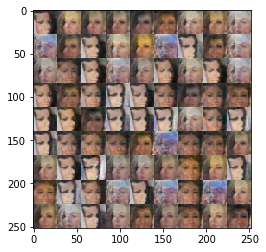


Epoch: 9/10 Time: 6:02:12 s. st_Tm: 0:00:52 s. #Steps:13088, DLoss: 0.1744 GLoss: 4.3909 guess:  80m. average: 101m.
Epoch: 9/10 Time: 6:03:04 s. st_Tm: 0:00:51 s. #Steps:13120, DLoss: 0.1152 GLoss: 3.2143 guess:  81m. average: 100m.
Epoch: 9/10 Time: 6:03:56 s. st_Tm: 0:00:51 s. #Steps:13152, DLoss: 0.2271 GLoss: 2.2728 guess:  81m. average:  98m.
Epoch: 9/10 Time: 6:04:48 s. st_Tm: 0:00:51 s. #Steps:13184, DLoss: 0.1114 GLoss: 3.5997 guess:  81m. average:  96m.
Epoch: 9/10 Time: 6:05:40 s. st_Tm: 0:00:52 s. #Steps:13216, DLoss: 0.2389 GLoss: 2.5290 guess:  81m. average:  94m.
Epoch: 9/10 Time: 6:06:33 s. st_Tm: 0:00:53 s. #Steps:13248, DLoss: 0.0699 GLoss: 4.7622 guess:  81m. average:  92m.
Epoch: 9/10 Time: 6:07:27 s. st_Tm: 0:00:54 s. #Steps:13280, DLoss: 0.2754 GLoss: 3.2026 guess:  82m. average:  90m.
Epoch: 9/10 Time: 6:08:19 s. st_Tm: 0:00:52 s. #Steps:13312, DLoss: 0.3111 GLoss: 1.6260 guess:  82m. average:  88m.


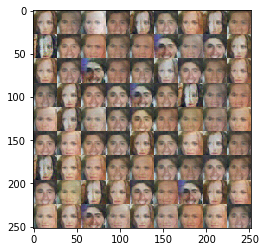

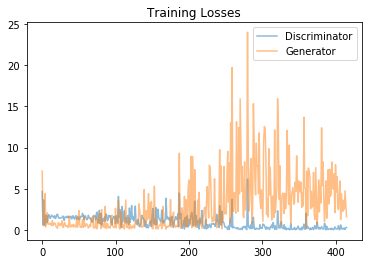

losses saved to:  ./pkl-files/saved_var_checkpoint/CelebA_run.pkl
Epoch: 9/10 Time: 6:09:12 s. st_Tm: 0:00:52 s. #Steps:13344, DLoss: 0.5223 GLoss: 1.9342 guess:  82m. average:  86m.
Epoch: 9/10 Time: 6:10:05 s. st_Tm: 0:00:53 s. #Steps:13376, DLoss: 0.1797 GLoss: 2.6566 guess:  82m. average:  84m.
Epoch: 9/10 Time: 6:10:57 s. st_Tm: 0:00:51 s. #Steps:13408, DLoss: 0.0437 GLoss: 6.2372 guess:  82m. average:  82m.
Epoch: 9/10 Time: 6:11:48 s. st_Tm: 0:00:51 s. #Steps:13440, DLoss: 0.2225 GLoss: 6.4185 guess:  83m. average:  80m.


In [ ]:
"""
# GLOBAL VAR 
- rather than changing the params train() uses - I added these params as global 
- which I know is not strictly right, but it works for me.
"""

# std. Hyper param
batch_size     = 256
z_dim          = 100

# I created a spreadsheet to try and understand beta1, beta2, m_0, v_0 - ended up with a 40* higher lr
# I can't say anything other than: these worked for me - hope they will for you too.
learning_rate  = 0.002
beta1          = 0.5

# to seperate the two data-runs, I will have to give the files different names 
filename       = 'CelebA_run'
Load_chk       = True  # False  # set this to [True], if you want to load the checkpoint and ass. losses-file

# https://medium.com/towards-data-science/gan-by-example-using-keras-on-tensorflow-backend-1a6d515a60d0
Gkeep_prob      = 0.5  # more drops -> lower keep prob but with fewer D_O layers (only in the dense)
Dkeep_prob      = 0.4

num_mv_avg      =  24                            
steps_printline =  32
steps_images    = 256 

steps_graph     = 512

# ran 10 previously - now run another 10
epochs          =   10

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
#epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.